In [56]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [57]:
import torch
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_Examples import make_lm_program_ig_batched, make_lm_program_ig
from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.Training.Trainer import visualize_training_results
from PFNExperiments.Training.FlowMatching.CFMLossOTGaussianBase_plus_NLL import CFMLossOTGaussianBase_plus_NLL
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC
from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM
from PFNExperiments.Training.TrainerCurriculumCNF_LearnedBaseDist_plus_nll import TrainerCurriculumCNF_LearnedBaseDist_plus_nll
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_Examples import make_lm_program_ig_batched, make_lm_program_ig
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist
from PFNExperiments.LinearRegression.Models.Transformer import MLP
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.Transformer_CNF_DoubleCondition2 import TransformerDecoderConditionalDouble_parallel, MLPConditionalDouble_parallel
from PFNExperiments.LinearRegression.Models.Transformer_CNF_LearnedBaseDistribution import TransformerReturnRepresentations, TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution

In [128]:
N = 100
P = 10
BATCH_SIZE = 3
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 67
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "Training/FlowMatching/SaveFolderTesting"

#BATCH_SIZE = 128

In [129]:
a = 5.0
b = 2.0
tau = 1.0

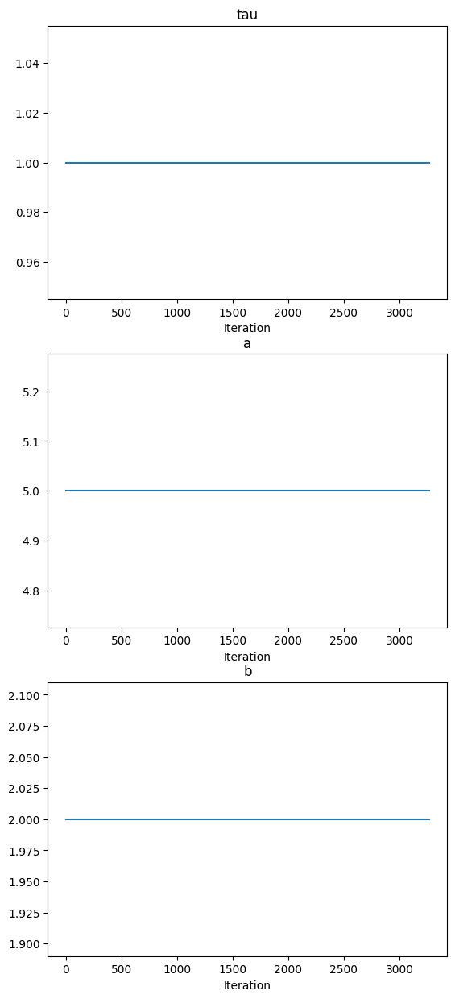

In [130]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("tau", curriculum.constant_scheduler(tau)),
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),

    ]
)
curriculum.plot_all_schedules()

In [131]:
curriculum.get_params(299*N_SAMPLES_PER_EPOCH)

{'tau': 1.0, 'a': 5.0, 'b': 2.0}

In [132]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_ig_batched,
    curriculum= curriculum,
    #base_distribution_sampling = GaussianSample,
    #coupling = None
)

####################################################################################################
Epoch 0


100%|██████████| 1/1 [00:00<00:00, 16.75it/s]

{'X': {'mean': tensor(0.5016), 'variance': tensor(0.0831), 'min': tensor(1.3411e-05), 'max': tensor(1.0000)}, 'y': {'mean': tensor(-0.1247), 'variance': tensor(1.6556), 'min': tensor(-4.6130), 'max': tensor(5.1854)}, 'beta': {'mean': tensor([-0.2349, -0.1113, -0.1314,  0.1785,  0.0283]), 'variance': tensor([0.8131, 0.9330, 1.3562, 0.8705, 0.8841]), 'min': tensor([-2.0389, -2.5621, -2.7066, -1.9863, -1.6813]), 'max': tensor([1.6651, 1.9411, 2.5613, 2.3595, 2.2318])}}
Statistics for sigma_squared:
Mean: tensor([0.4957])
Variance: tensor([0.0569])
Min: tensor([0.1566])
Max: tensor([1.2916])


Statistics for time:
Mean: 0.5839291997809908
Variance: 0.07826921274088473
Min: 0.0015767812728881836
Max: 0.9798253774642944


Statistics for base_sample_beta:
Mean: tensor([-0.0746, -0.0676,  0.0089, -0.1684, -0.0537])
Variance: tensor([0.9425, 0.9669, 0.9831, 0.8418, 1.2042])
Min: tensor([-3.2213, -2.4171, -2.4503, -2.0501, -2.3671])
Max: tensor([1.6520, 1.7188, 2.6216, 2.5565, 2.2460])





C:\Users\arik_\Documents\Dokumente\Job_Clausthal\PFNs\Repository\PFNExperiments\LinearRegression\GenerativeModels\GenerateData.py:264: UserWarning: var(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at ..\aten\src\ATen\native\ReduceOps.cpp:1807.)
  variances = {key: torch.var(stacked_data[key], dim=0) for key in stacked_data.keys()}


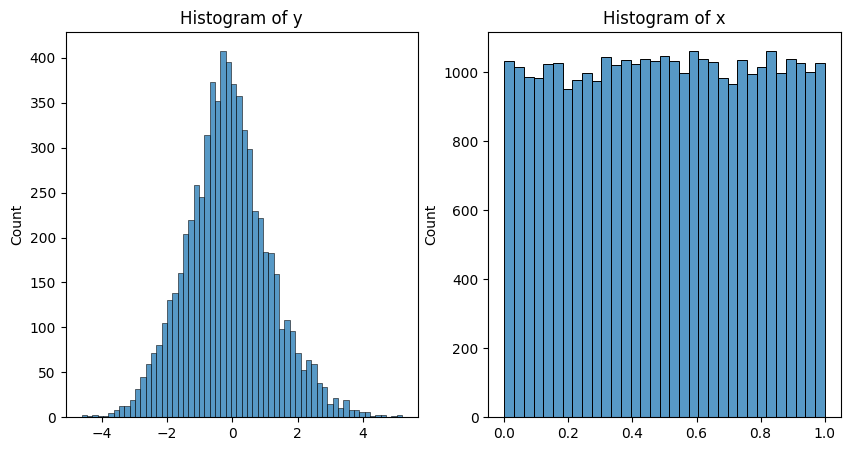

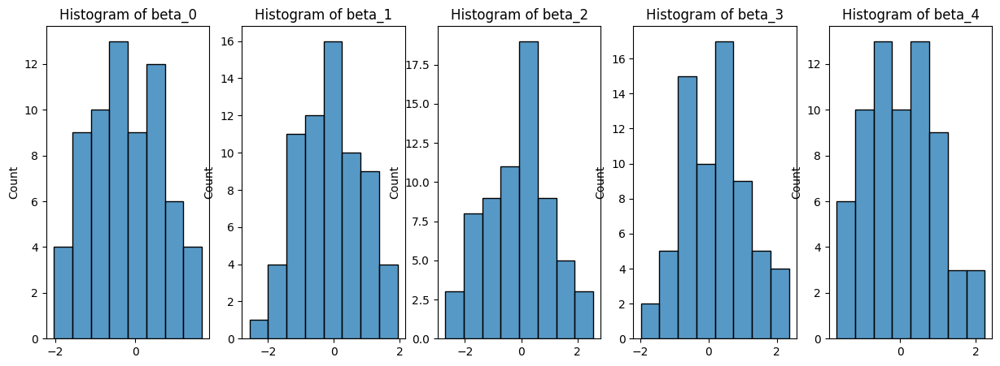

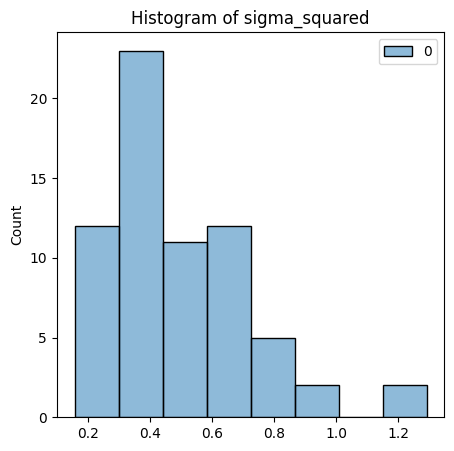

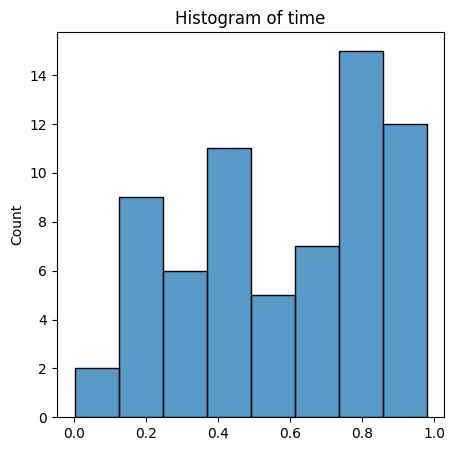

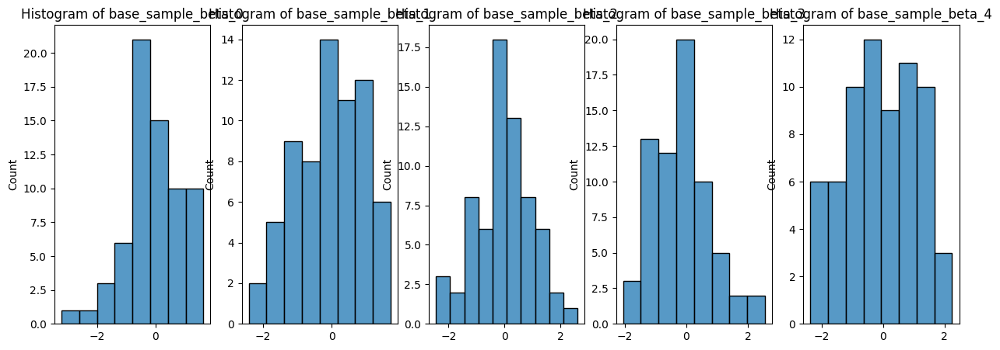

####################################################################################################
Epoch 99


100%|██████████| 1/1 [00:00<00:00, 21.25it/s]

{'X': {'mean': tensor(0.4978), 'variance': tensor(0.0840), 'min': tensor(3.9876e-05), 'max': tensor(1.0000)}, 'y': {'mean': tensor(0.2795), 'variance': tensor(2.4715), 'min': tensor(-6.4479), 'max': tensor(6.0982)}, 'beta': {'mean': tensor([0.1606, 0.0446, 0.1162, 0.1368, 0.1278]), 'variance': tensor([1.0833, 1.3241, 0.8372, 1.2712, 1.1555]), 'min': tensor([-2.2151, -1.9575, -1.9325, -2.7042, -1.9756]), 'max': tensor([2.5283, 2.7226, 2.6275, 3.0599, 2.6749])}}
Statistics for sigma_squared:
Mean: tensor([0.4974])
Variance: tensor([0.0863])
Min: tensor([0.1775])
Max: tensor([1.9656])


Statistics for time:
Mean: 0.5297744514337227
Variance: 0.07283538691059979
Min: 0.029400944709777832
Max: 0.9460009932518005


Statistics for base_sample_beta:
Mean: tensor([-0.0587, -0.0250, -0.0542, -0.1248, -0.0541])
Variance: tensor([1.3209, 1.0876, 0.7313, 1.2086, 0.5662])
Min: tensor([-3.3811, -2.9319, -2.1921, -3.2111, -1.5353])
Max: tensor([2.3470, 2.5700, 2.1920, 2.2714, 1.5771])





C:\Users\arik_\Documents\Dokumente\Job_Clausthal\PFNs\Repository\PFNExperiments\LinearRegression\GenerativeModels\GenerateData.py:264: UserWarning: var(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at ..\aten\src\ATen\native\ReduceOps.cpp:1807.)
  variances = {key: torch.var(stacked_data[key], dim=0) for key in stacked_data.keys()}


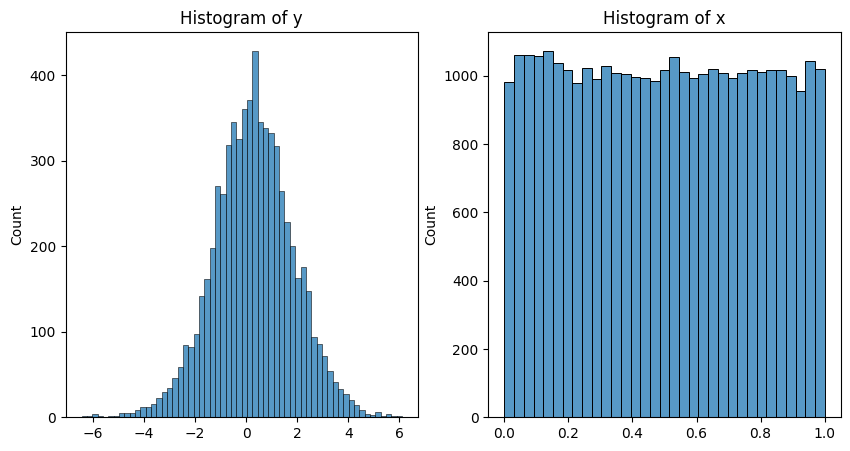

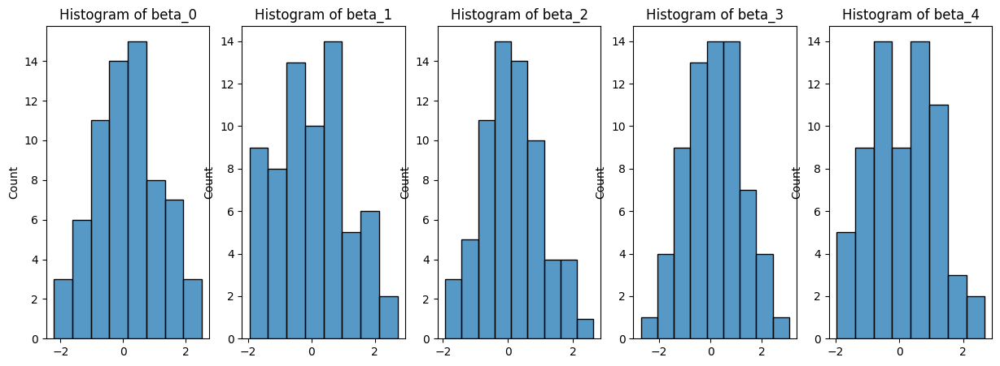

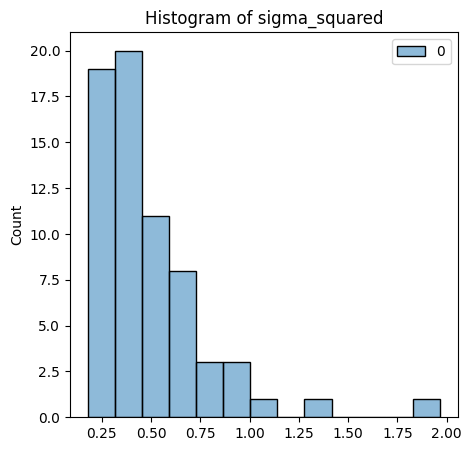

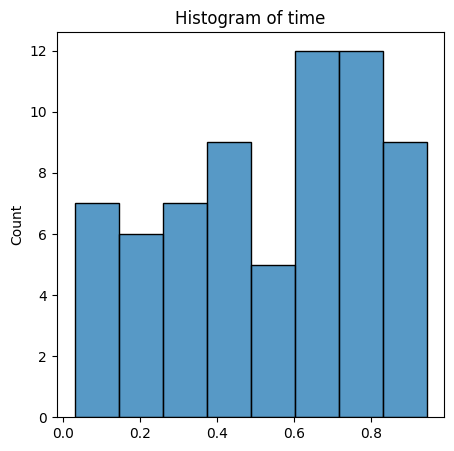

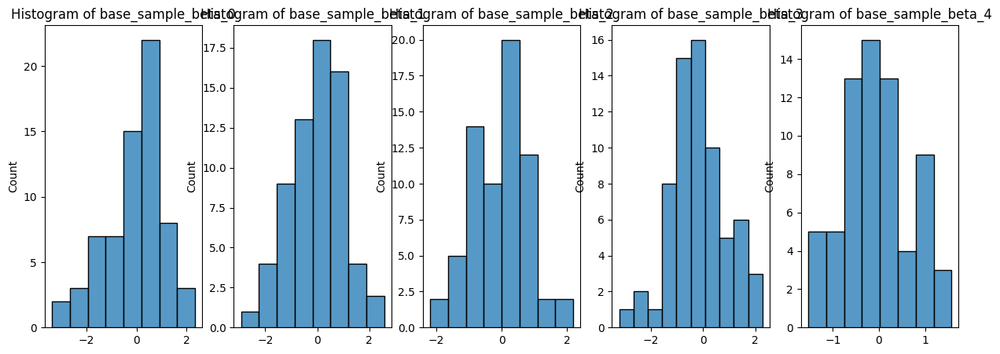

[{'X': {'mean': tensor(0.5016),
   'variance': tensor(0.0831),
   'min': tensor(1.3411e-05),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(-0.1247),
   'variance': tensor(1.6556),
   'min': tensor(-4.6130),
   'max': tensor(5.1854)},
  'beta': {'mean': tensor([-0.2349, -0.1113, -0.1314,  0.1785,  0.0283]),
   'variance': tensor([0.8131, 0.9330, 1.3562, 0.8705, 0.8841]),
   'min': tensor([-2.0389, -2.5621, -2.7066, -1.9863, -1.6813]),
   'max': tensor([1.6651, 1.9411, 2.5613, 2.3595, 2.2318])}},
 {'X': {'mean': tensor(0.4978),
   'variance': tensor(0.0840),
   'min': tensor(3.9876e-05),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(0.2795),
   'variance': tensor(2.4715),
   'min': tensor(-6.4479),
   'max': tensor(6.0982)},
  'beta': {'mean': tensor([0.1606, 0.0446, 0.1162, 0.1368, 0.1278]),
   'variance': tensor([1.0833, 1.3241, 0.8372, 1.2712, 1.1555]),
   'min': tensor([-2.2151, -1.9575, -1.9325, -2.7042, -1.9756]),
   'max': tensor([2.5283, 2.7226, 2.6275, 3.0599, 2.6749])}}

In [133]:
data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = 5,
    used_batch_samples = 1
)


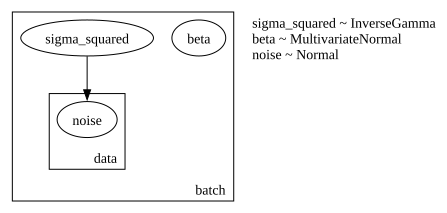

In [134]:
data_generator.render_model()

In [135]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
    )

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 6600 and 3300 respectively


In [136]:
sample_batch = next(iter(epoch_loader[0][0]))

In [137]:
sample_batch.keys()

dict_keys(['x', 'y', 'sigma_squared', 'beta', 'time', 'base_sample_beta'])

In [138]:
for key in sample_batch.keys():
    print(key, sample_batch[key].shape)

x torch.Size([3, 100, 10])
y torch.Size([3, 100])
sigma_squared torch.Size([3, 1])
beta torch.Size([3, 10])
time torch.Size([3])
base_sample_beta torch.Size([3, 10])


In [139]:
encoder = TransformerReturnRepresentations(
    n_features= P+1,
    seq_len= N,
    d_model= 512,
    n_heads= 8,
    dim_feedforward=512*2,
    dropout_rate = 0.1,
    n_layers=6,
    n_skip_layers_final_heads = 2,
    n_output_units_per_head=[P, P*P, P]
)

#encoder.load_state_dict(torch.load("C:/Users/arik_/Documents/Dokumente/Job_Clausthal/PFNs/Repository/PFNExperiments/LinearRegression/Models/TestModels/SavedBaseModel/model.pth", map_location=torch.device('cpu')))
# get the correct class to transform model predictions to posterior samples

c:\Users\arik_\Documents\Dokumente\Job_Clausthal\PFNs\Repository\PFNExperiments\.conda\lib\site-packages\torch\nn\modules\transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [140]:
# Initialize the pre-trained encoder model


model_posterior = ModelPosteriorFullGaussian2(cov_reg_factor = 1e-3, use_lowrank_normal = False, diag_transform = lambda x: x**2)

nll_loss = model_posterior.negative_log_likelihood
nll_loss_avg = model_posterior.negative_log_likelihood_avg
nll_loss_std = model_posterior.negative_log_likelihood_std
nll_loss_median = model_posterior.negative_log_likelihood_median

mlp_to_process_encoder_output = MLP(
    n_input_units = encoder.d_model,
    n_output_units= 1024,
    n_hidden_units= 1024,
    n_skip_layers= 3,
    dropout_rate = 0.1
)

mlp_to_process_time_conditioning = MLP(
    n_input_units = 1,
    n_output_units = 64,
    n_hidden_units= 64,
    n_skip_layers= 2,
    dropout_rate = 0.1
)
decoder = TransformerDecoderConditionalDouble_parallel(
    n_input_features= P,
    d_model_decoder= 256,
    d_model_encoder= encoder.d_model,
    n_heads= 8,
    d_ff = 256*2,
    dropout= 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units,
    n_layers= 1,
    use_positional_encoding=False,
    use_self_attention=False,
)
mlp_to_process_decoder_output = MLPConditionalDouble_parallel(
    n_input_units= decoder.d_model_decoder,
    n_output_units = P,
    n_hidden_units = 256, 
    n_skip_layers = 2,
    dropout_rate = 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units
)
model = TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution(
    encoder = encoder,
    model_posterior = model_posterior,
    mlp_to_process_encoder_output = mlp_to_process_encoder_output,
    mlp_to_process_time_conditioning = mlp_to_process_time_conditioning,
    mlp_to_process_decoder_output = mlp_to_process_decoder_output,
    decoder = decoder,
    freeze_encoder=False,
)

In [141]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [142]:
'{:.2e}'.format(count_parameters(model))

'4.67e+07'

In [143]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [144]:
lr = 1e-4
opt = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)

In [156]:
loss_fun = CFMLossOTGaussianBase_plus_NLL(
    weight_nll = 0.5,
    NLL_Loss_function= nll_loss,
    sigma_min=1e-3,
    return_sub_losses=True
)

In [146]:
scheduler = OneCycleLR(opt,
                       max_lr = 1e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor=1e2)

scheduler = ReduceLROnPlateau(opt)

additional_evals = {
    nll_loss_avg,
    nll_loss_std,
    nll_loss_median
    
}

In [157]:
trainer = TrainerCurriculumCNF_LearnedBaseDist_plus_nll(
    model = model,
    optimizer=opt,
    scheduler = None,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    use_same_timestep_per_batch = False,
    using_OTLossGaussianBase = True,
    sub_losses_names = ["loss_FM", "loss_NLL"]
    
)

In [158]:
trainer.save_path

'Training/FlowMatching/SaveFolderTesting/experiment_2024_06_26_17_00_33'

In [159]:
trainer.validate()

100%|██████████| 2/2 [00:02<00:00,  1.32s/it]


{'loss_mean': 19.922138214111328,
 'loss_median': 18.644784927368164,
 'loss_std': 1.806451678276062,
 'loss_FM_mean': 1.2950873374938965,
 'loss_FM_median': 1.0559437274932861,
 'loss_FM_std': 0.33820006251335144,
 'loss_NLL_mean': 38.5491943359375,
 'loss_NLL_median': 35.755340576171875,
 'loss_NLL_std': 3.9511032104492188}

In [160]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 4172), started 0:08:40 ago. (Use '!kill 4172' to kill it.)

In [161]:
r = trainer.train()

Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 0


100%|██████████| 2/2 [00:03<00:00,  1.55s/it]


Epoch 0:
Training: {'loss_mean': 12.064465522766113, 'loss_median': 12.149404525756836, 'loss_std': 1.839416265487671, 'loss_FM_mean': 4.269230842590332, 'loss_FM_median': 4.807906150817871, 'loss_FM_std': 1.3487906455993652, 'loss_NLL_mean': 19.859703063964844, 'loss_NLL_median': 19.377277374267578, 'loss_NLL_std': 3.137814521789551}
Validation: {'loss_mean': 31.822998046875, 'loss_median': 20.377901077270508, 'loss_std': 16.18581199645996, 'loss_FM_mean': 1.1461429595947266, 'loss_FM_median': 0.8677059412002563, 'loss_FM_std': 0.3937695026397705, 'loss_NLL_mean': 62.499855041503906, 'loss_NLL_median': 39.88809585571289, 'loss_NLL_std': 31.977853775024414}
Validation curriculum: {'loss_mean': 14.74776840209961, 'loss_median': 9.381463050842285, 'loss_std': 7.589102268218994, 'loss_FM_mean': 1.0750391483306885, 'loss_FM_median': 0.9922834634780884, 'loss_FM_std': 0.11703429371118546, 'loss_NLL_mean': 28.42049789428711, 'loss_NLL_median': 17.77064323425293, 'loss_NLL_std': 15.0611705780

 82%|████████▏ | 9/11 [00:10<00:02,  1.21s/it]


KeyboardInterrupt: 

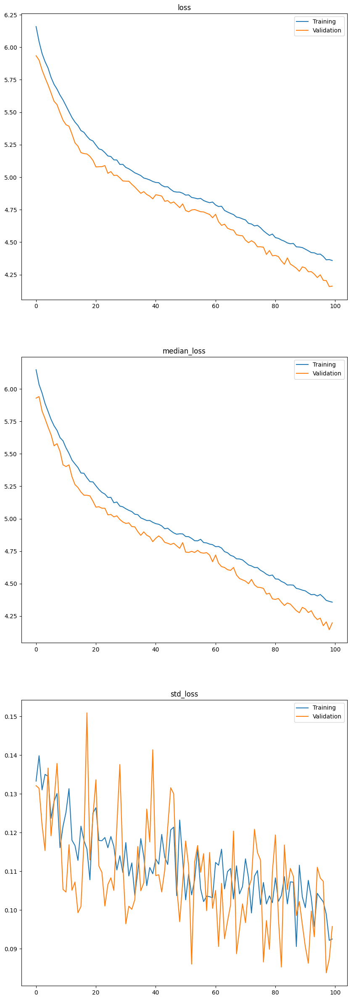

In [ ]:
visualize_training_results(r, loglog = False)

In [ ]:
trainer.load_best_model()

In [ ]:
model = trainer.model

In [ ]:
model.eval()

TransformerCNFConditionalDecoder(
  (condition_embedding_layer): MLP(
    (linear1): Linear_block(
      (fc): Linear(in_features=1, out_features=64, bias=True)
      (act): LeakyReLU(negative_slope=0.01)
      (bn): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop): Dropout(p=0.1, inplace=False)
    )
    (hidden_layers): Sequential(
      (0): Linear_skip_block(
        (fc): Linear(in_features=64, out_features=64, bias=True)
        (act): LeakyReLU(negative_slope=0.01)
        (bn): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (drop): Dropout(p=0.1, inplace=False)
      )
    )
    (linear_final): Linear(in_features=64, out_features=64, bias=True)
  )
  (transformer_encoder): TransformerEncoder(
    (embedding_layer): Linear(in_features=5, out_features=64, bias=True)
    (positional_encoding): PositionalEncoding(
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder_blocks): ModuleList

In [ ]:
trainer.load_best_model()

In [ ]:
trainer.test()

100%|██████████| 196/196 [00:36<00:00,  5.38it/s]


{'loss': 5.825122833251953,
 'median_loss': 5.812909126281738,
 'std_loss': 0.12248415499925613}

In [ ]:
full_model = ModelToPosteriorCNF_LearnedBaseDist(
    model = trainer.model,
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=100,
    solve_adjoint = True,
    sample_only_base_dist = True
)

In [ ]:
benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program_ig(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)

params for pprogram: {'tau': 1.0, 'a': 5.0, 'b': 2.0}
        def multivariate_lm_return_dict(x: torch.Tensor, y: torch.Tensor = None) -> dict:
                # Define distributions for the global parameters
                sigma_squared_dist = dist.InverseGamma(a, b)

                beta_cov = torch.eye(x.shape[1]) * (tau ** 2)  # the covariance matrix of the parameters of the linear model

                sigma_squared = pyro.sample("sigma_squared", sigma_squared_dist).squeeze()

                beta_dist = dist.MultivariateNormal(torch.zeros(x.shape[1]), beta_cov)
                beta = pyro.sample("beta", beta_dist)

                # Compute mean using matrix multiplication
                mean = torch.matmul(x, beta)

                with pyro.plate("data", len(x)):
                        y = pyro.sample("obs", pyro.distributions.Normal(mean, sigma_squared), obs=y)


                return {
                        "x": x,
                        "y": y,
                      

In [ ]:
test_loader = trainer.testset

In [ ]:
test_batch = next(iter(test_loader))

In [ ]:
test_batch["beta"][:5]

tensor([[ 0.5883, -0.5933, -0.0914,  1.1878,  0.0389, -1.0784,  2.0642, -1.5490,
         -2.4100, -0.1844],
        [-0.1500,  0.5958,  1.7806, -1.6092,  0.9243, -0.0218,  0.8707,  1.5621,
          0.3766,  0.9844]])

In [ ]:
hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=50, n_samples=50)

comparison_model_hmc =  CompareComparisonModels(
    comparison_model_1=full_model,
    comparison_model_2=hmc_sampler,
    n_samples_comparison_model_1=100,
    save_path = trainer.save_path
)


Sample: 100%|██████████| 100/100 [00:07, 13.41it/s, step size=2.70e-01, acc. prob=0.783]


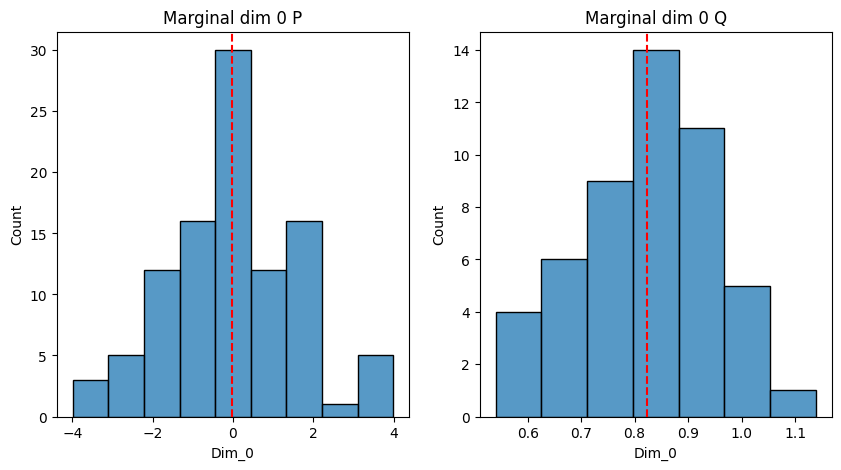

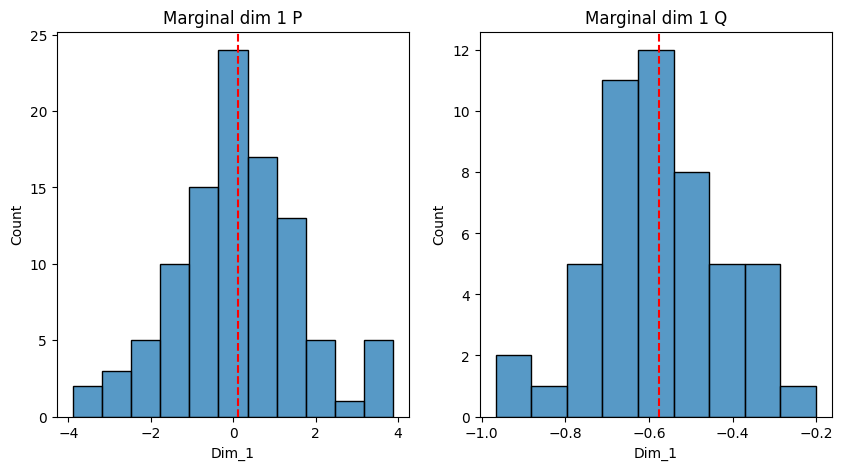

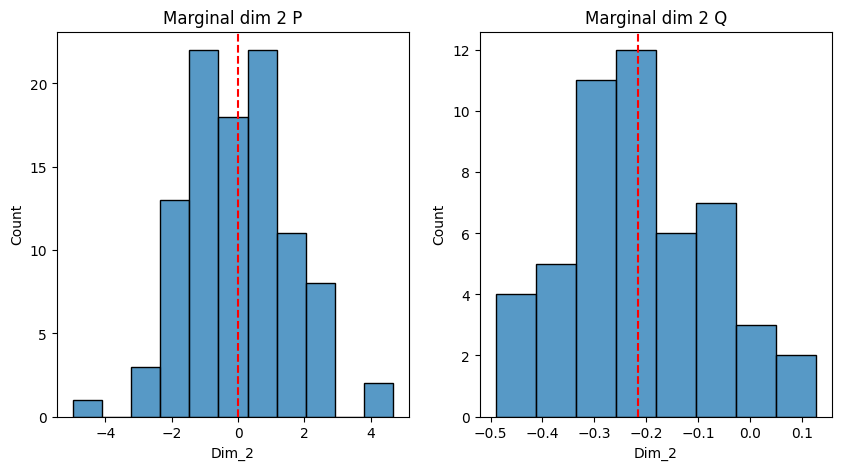

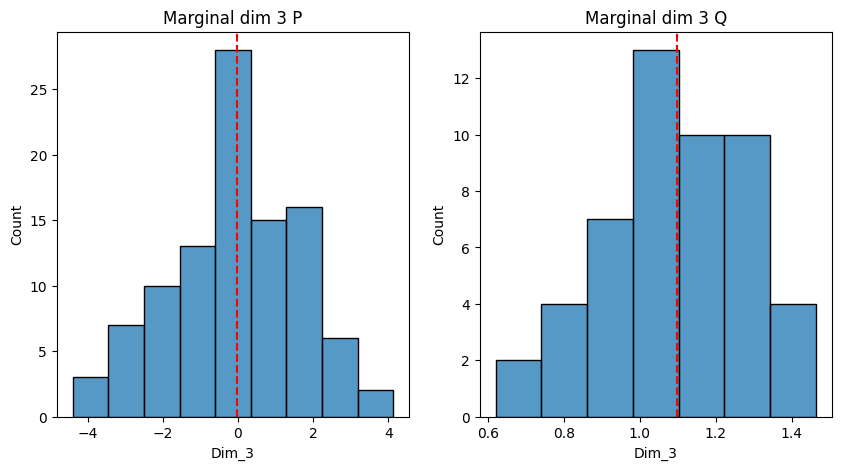

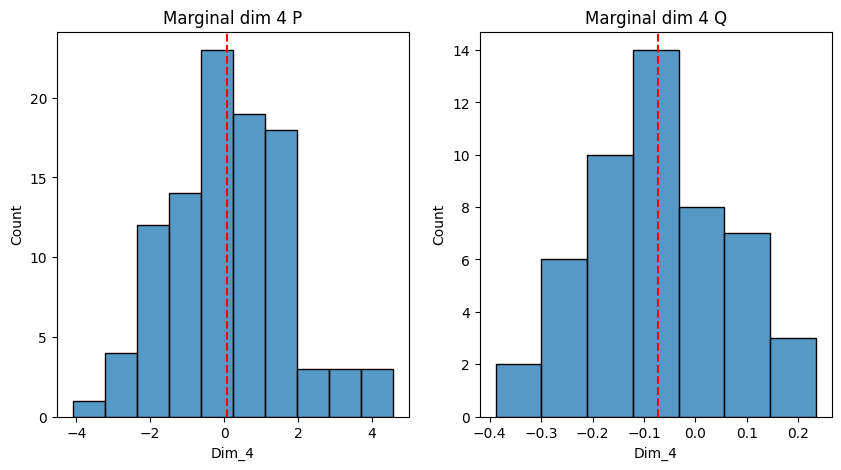

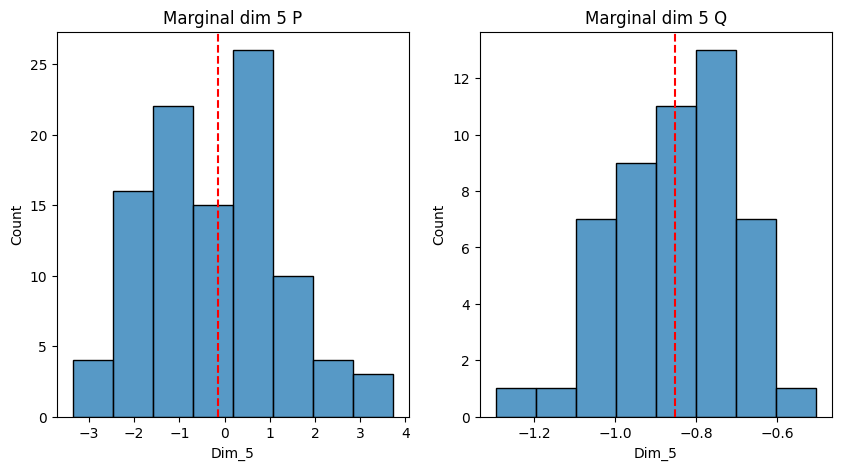

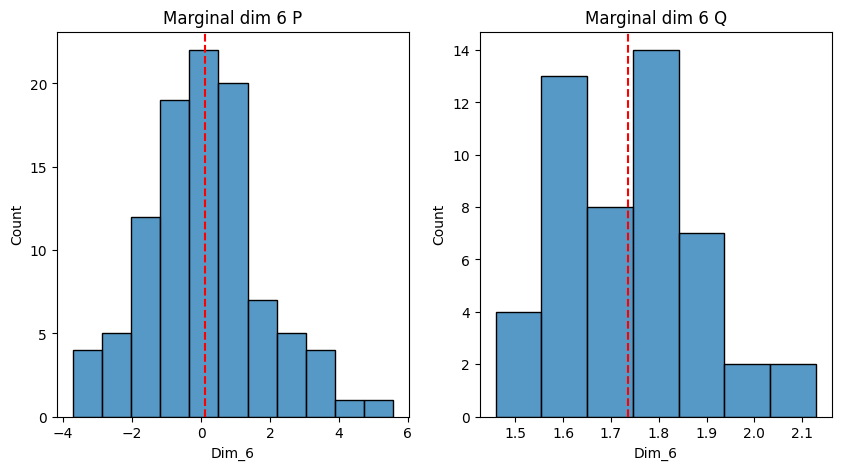

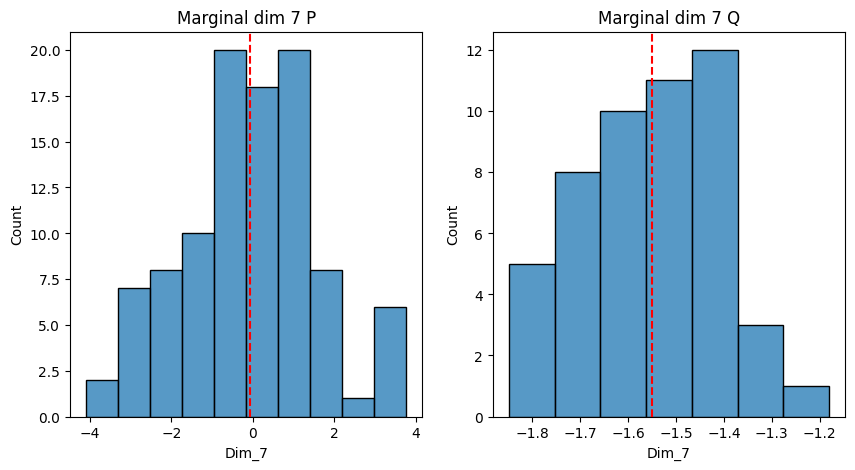

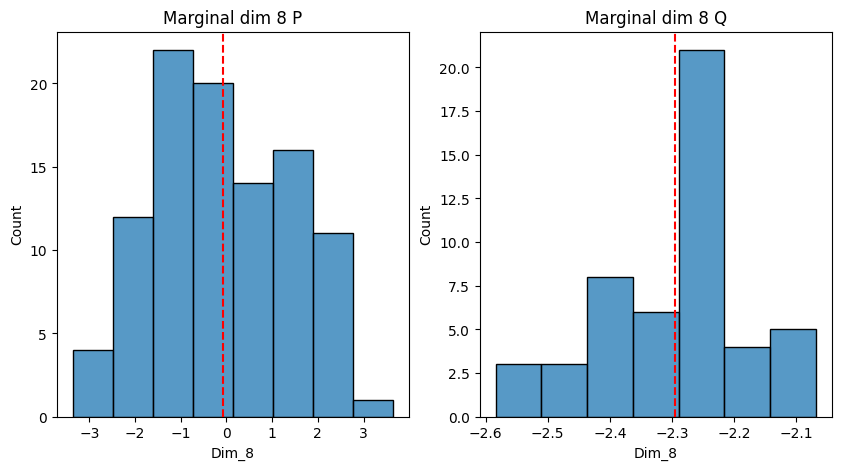

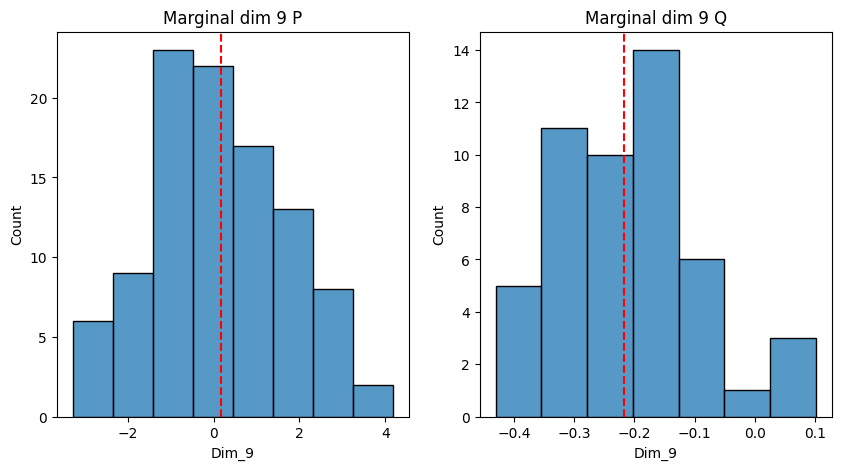

KeyboardInterrupt: 

In [ ]:
r_hmc = comparison_model_hmc.compare_sample_metrics_batch(test_batch["x"][:3].cpu(), test_batch["y"][:3].cpu())

In [ ]:
print(r_hmc[1])
print(r_hmc[2])

{'CST_accuracy_avg': tensor(0.7900), 'CST_roc_auc_score_avg': tensor(0.7900), 'MMD_avg': tensor(0.9399), 'Wasserstein_distance with metric euclidean_avg': tensor(2.8844)}
{'CST_accuracy_std': tensor(0.0346), 'CST_roc_auc_score_std': tensor(0.0346), 'MMD_std': tensor(0.1294), 'Wasserstein_distance with metric euclidean_std': tensor(0.2718)}


In [ ]:
vi = Variational_Inference(
    pprogram=pprogram1,
    guide = None,
    n_steps = 2000,
    n_samples=10_000,
    lr = 1e-2
)

....................


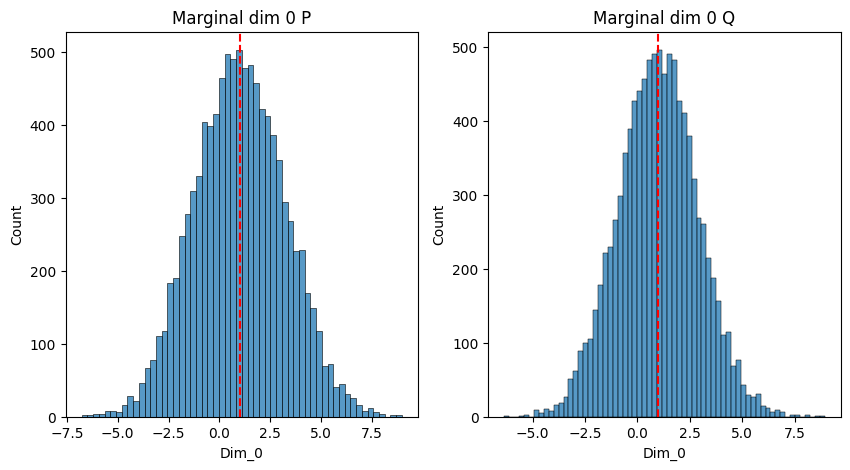

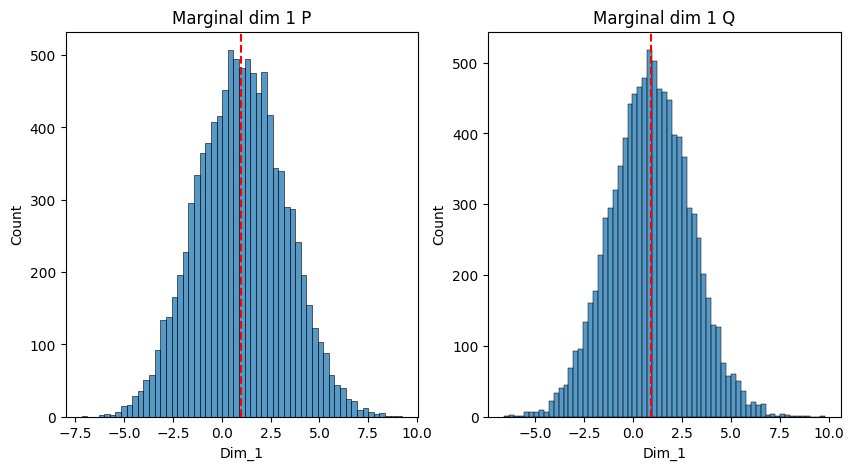

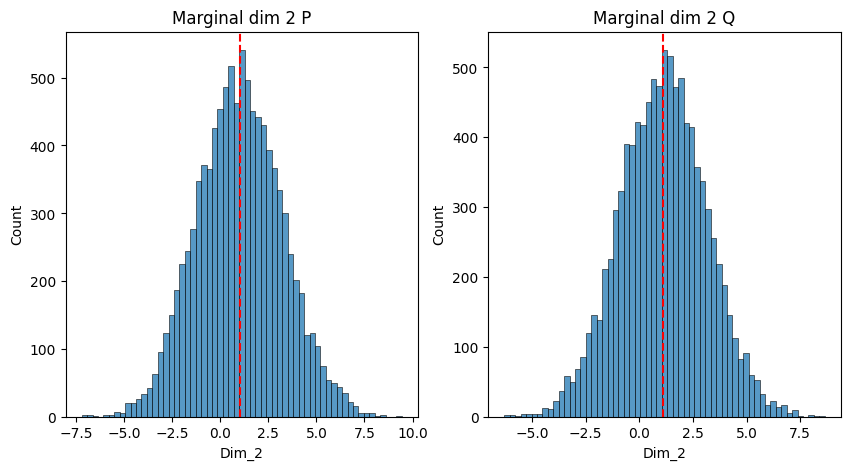

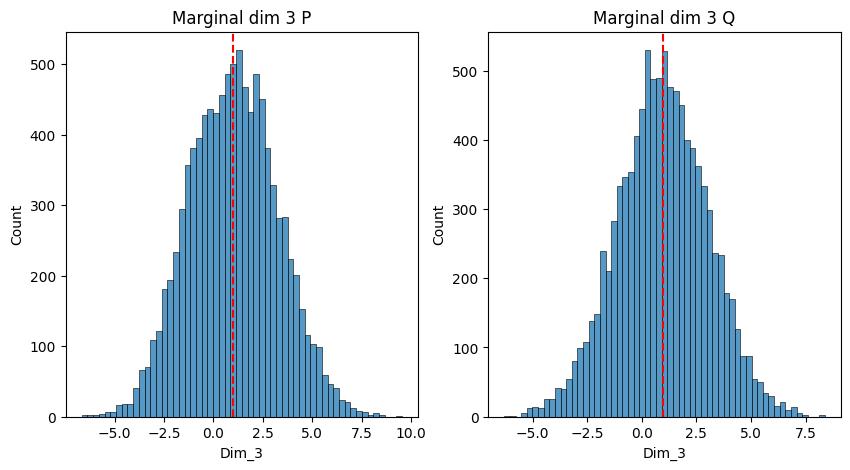

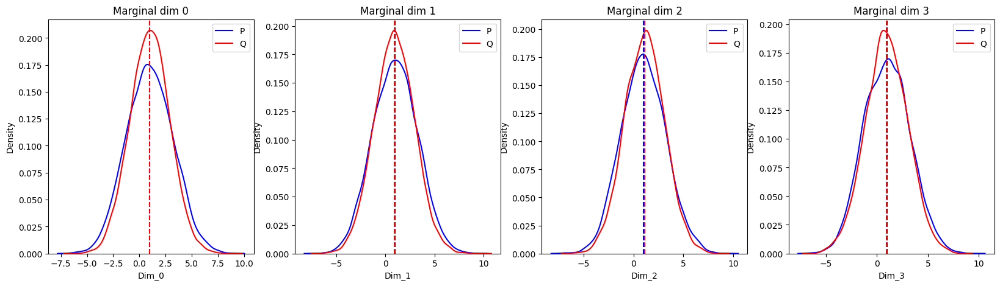

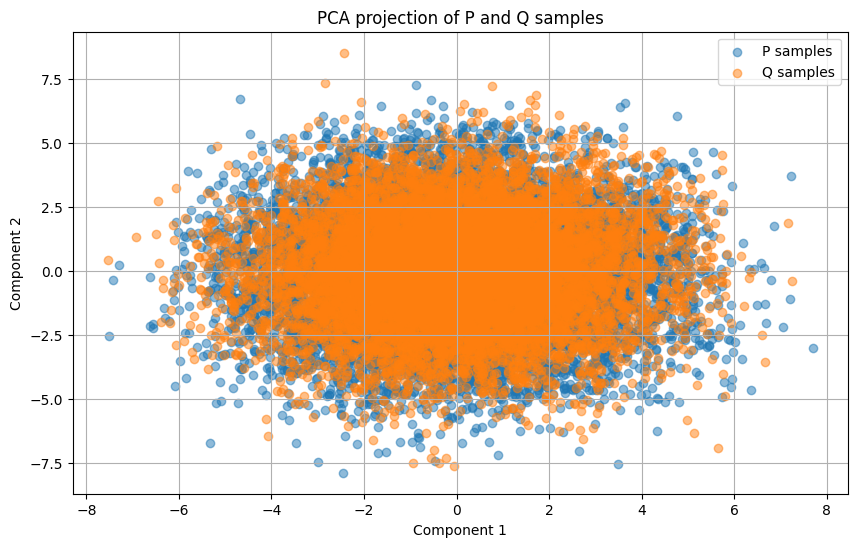

c:\Users\arik_\Documents\Dokumente\Job_Clausthal\PFNs\Repository\PFNExperiments\.conda\lib\site-packages\ot\lp\__init__.py:571: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  check_result(result_code)


....................


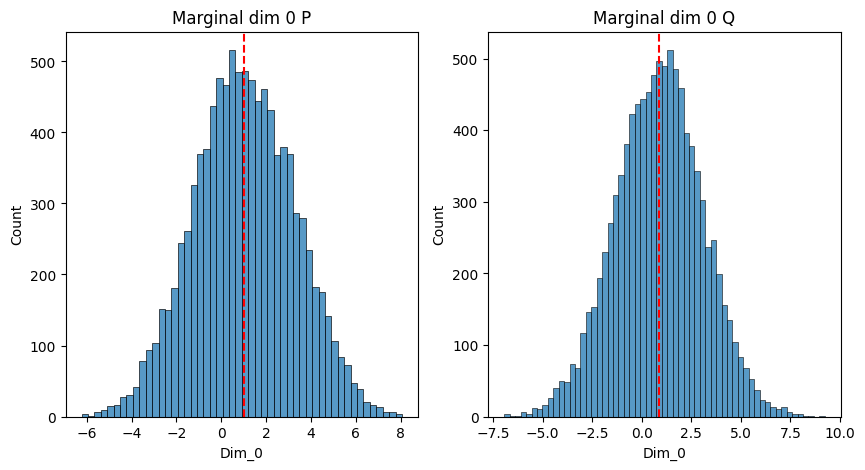

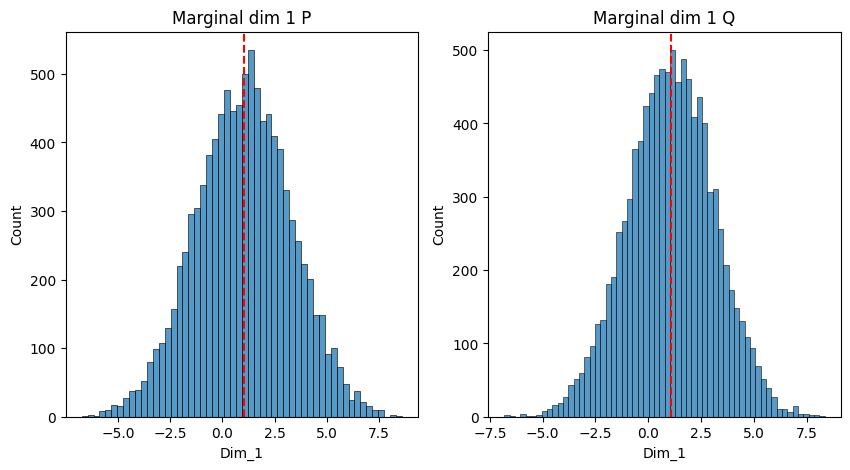

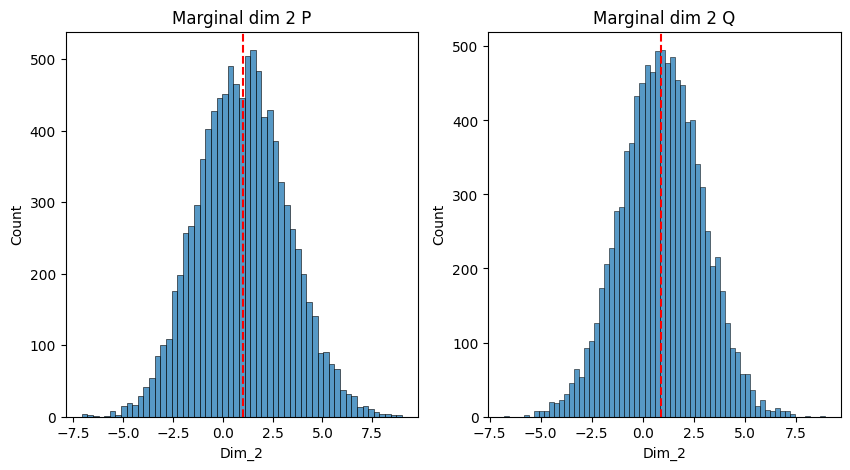

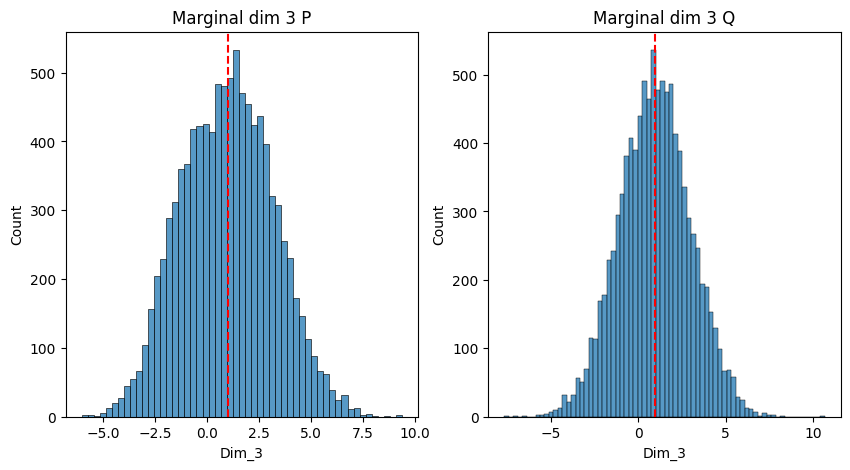

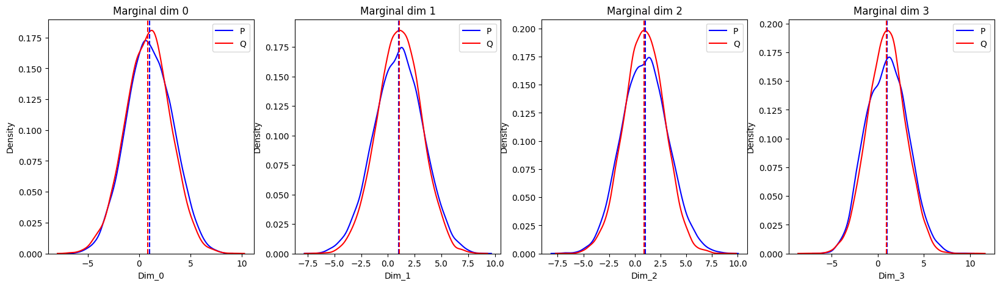

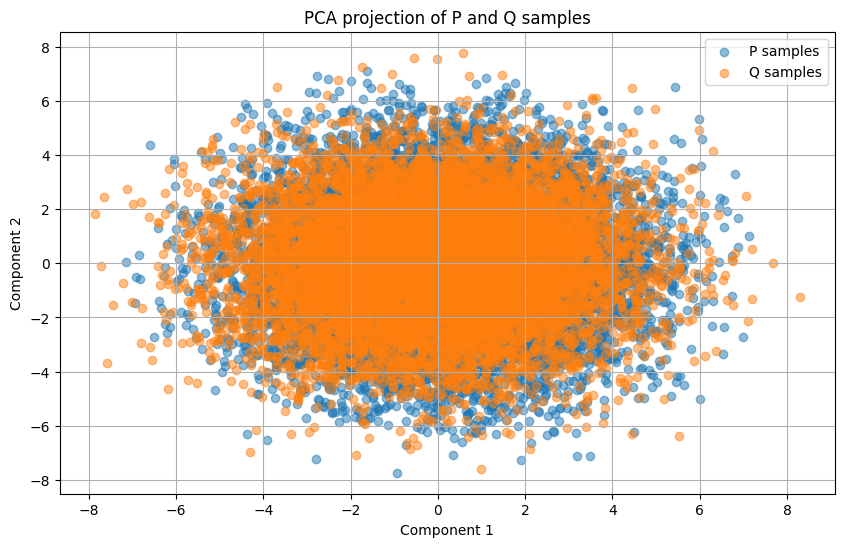

TypeError: 'float' object is not iterable

In [ ]:
comparison_model_vi =  CompareComparisonModels(
    comparison_model_1=full_model,
    comparison_model_2=vi,
    n_samples_comparison_model_1=10_000,
    save_path = trainer.save_path
)

r_vi = comparison_model_vi.compare_sample_metrics_batch(test_batch["x"][:5].cpu(), test_batch["y"][:5].cpu())

In [ ]:
print(r_vi)

([{'CST': {'accuracy': 0.851, 'roc_auc_score': 0.851}, 'MMD': 0.382432222366333, 'Wasserstein_distance with metric euclidean': 0.44791263341903687, 'mean_stats': {'absolute_mean_diff': tensor(0.0558), 'squared_mean_diff': tensor(0.0045), 'P_mean': tensor([-1.0746,  0.6922,  0.1665, -0.3666, -0.5925, -0.6509, -0.9716,  1.7523,
        -0.4697, -1.4973]), 'Q_mean': tensor([-0.9776,  0.7030,  0.2077, -0.3230, -0.5999, -0.7305, -0.9898,  1.6816,
        -0.3448, -1.4322])}, 'std_stats': {'absolute_std_diff': tensor(0.0654), 'squared_std_diff': tensor(0.0044), 'P_std': tensor([0.2018, 0.1914, 0.1939, 0.2014, 0.1959, 0.1951, 0.2007, 0.2001, 0.2074,
        0.2023]), 'Q_std': tensor([0.1268, 0.1334, 0.1499, 0.1359, 0.1262, 0.1344, 0.1170, 0.1246, 0.1604,
        0.1269])}, 'q_025_stats': {'absolute_q_025_diff': tensor(0.1429), 'squared_q_025_diff': tensor(0.0250), 'P_q_025': tensor([-1.4545,  0.3094, -0.1885, -0.7536, -0.9733, -1.0300, -1.3322,  1.3717,
        -0.8687, -1.9311]), 'Q_q_025': 

In [ ]:
comparison_model_comparer = CompareComparisonModels(
    comparison_model_1=vi,
    comparison_model_2=hmc_sampler,
    n_samples_comparison_model_1=1000,
    save_path = trainer.save_path
)

.

/usr/local/lib/python3.10/dist-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'beta_var'}
  warnings.warn(


...................


Sample: 100%|██████████| 800/800 [00:55, 14.32it/s, step size=1.86e-01, acc. prob=0.930]


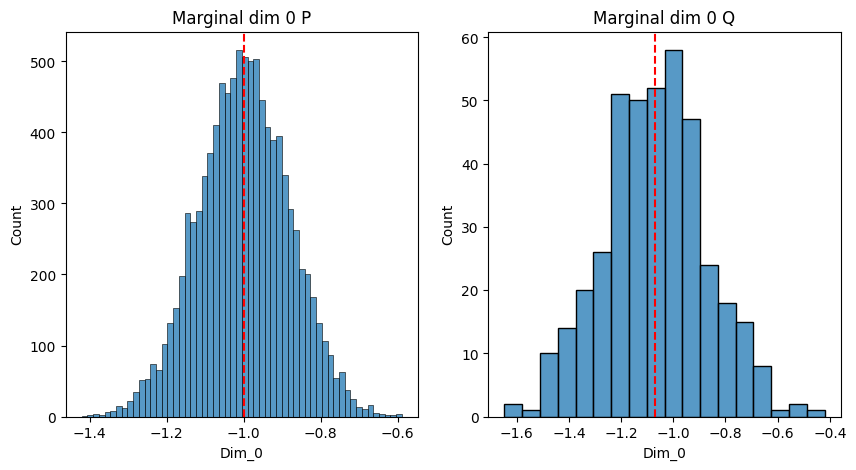

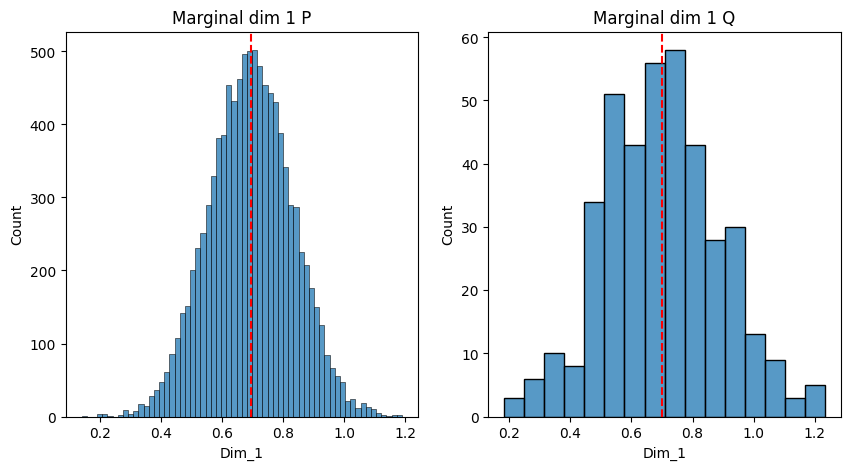

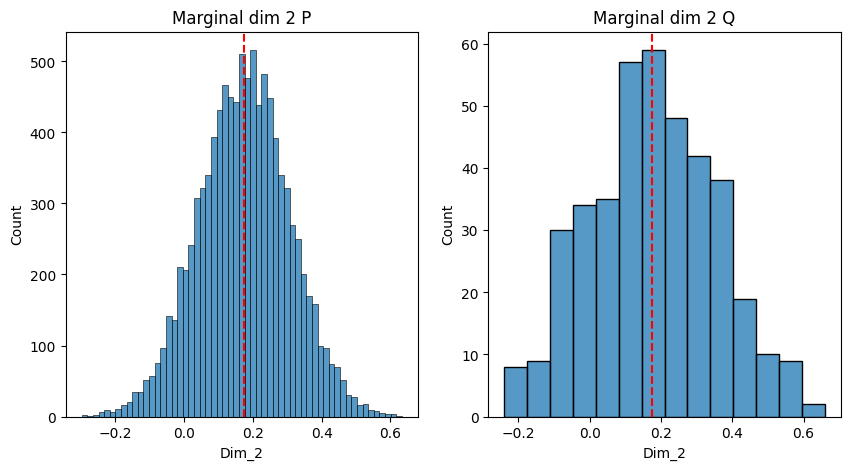

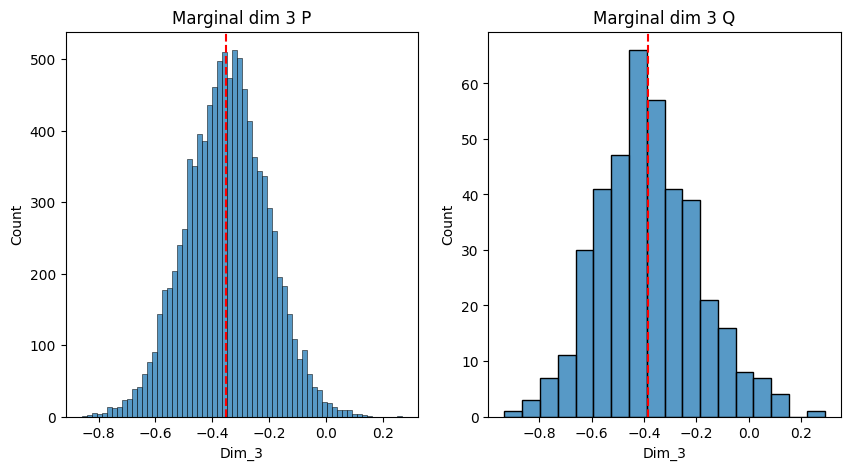

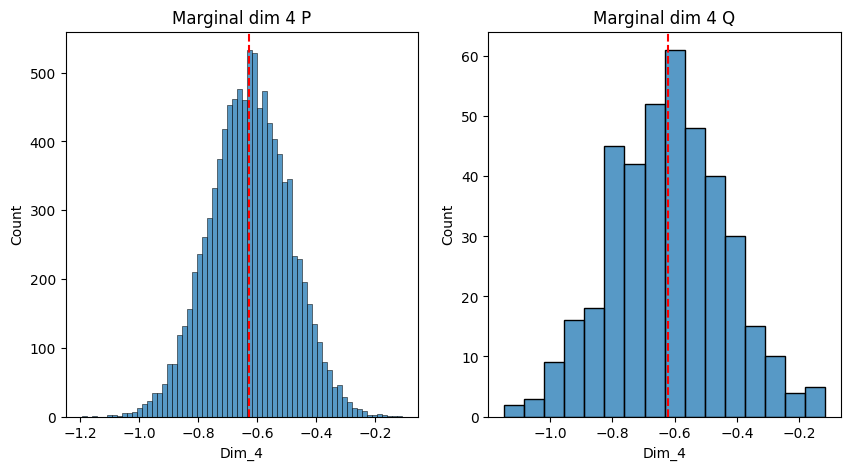

...

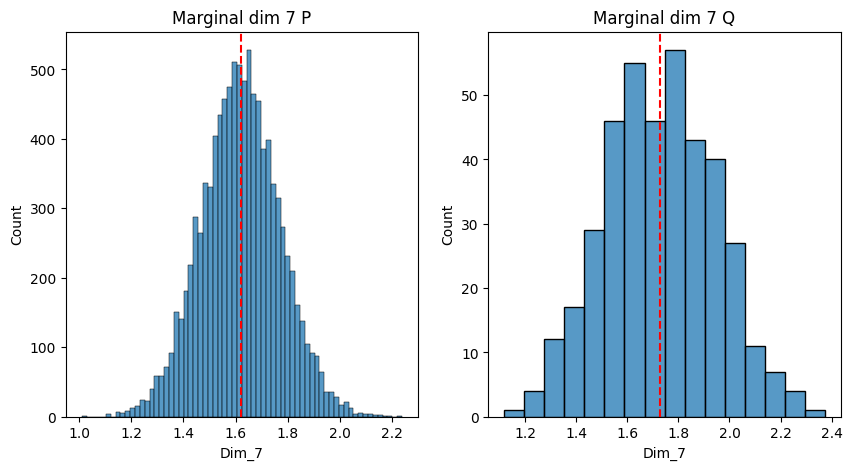

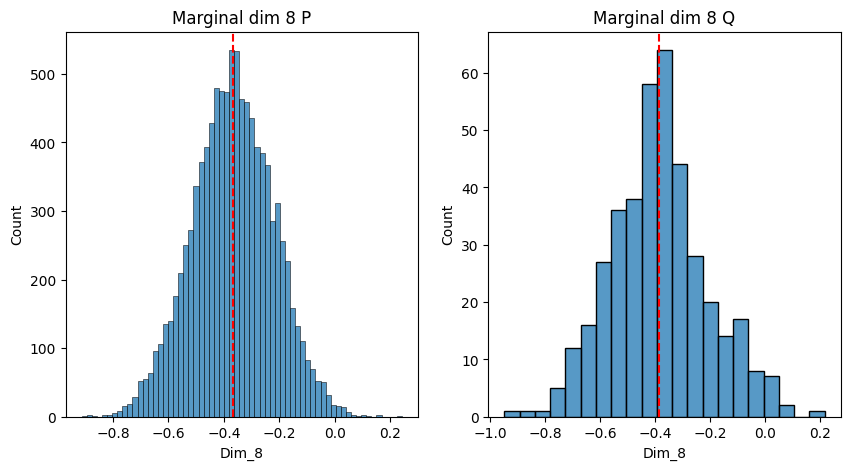

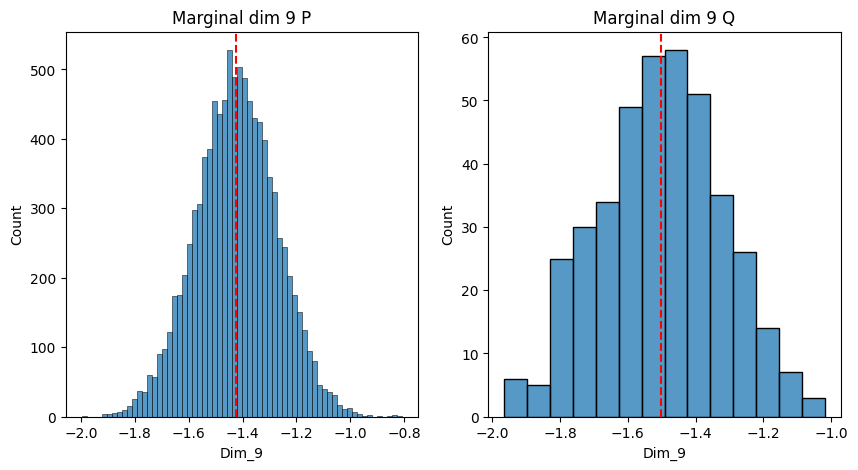

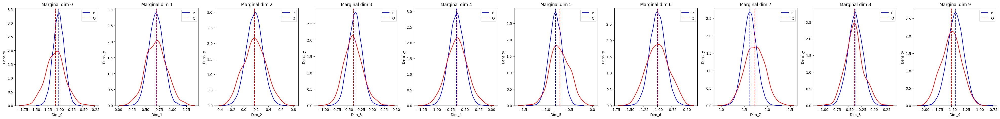

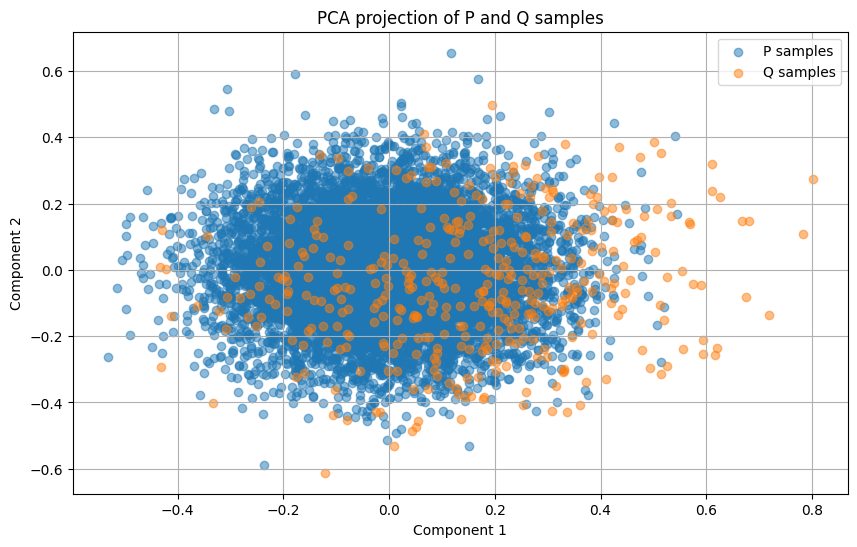

/usr/local/lib/python3.10/dist-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'beta_var'}
  warnings.warn(


....................


Sample: 100%|██████████| 800/800 [00:49, 16.22it/s, step size=2.02e-01, acc. prob=0.926]


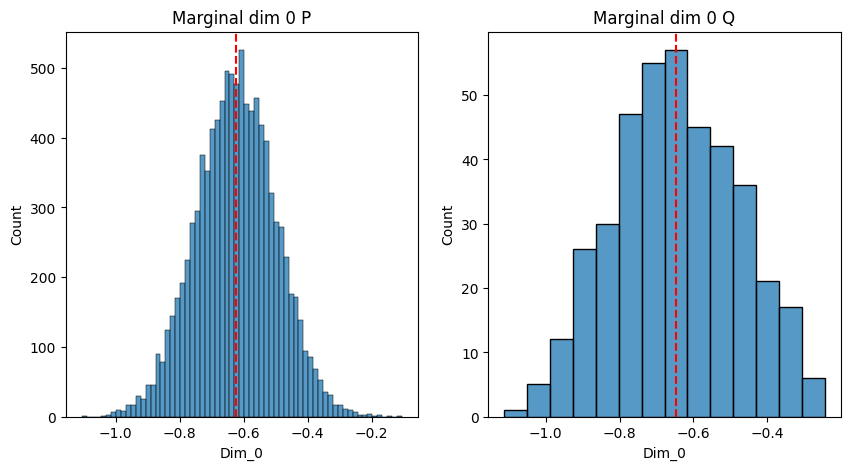

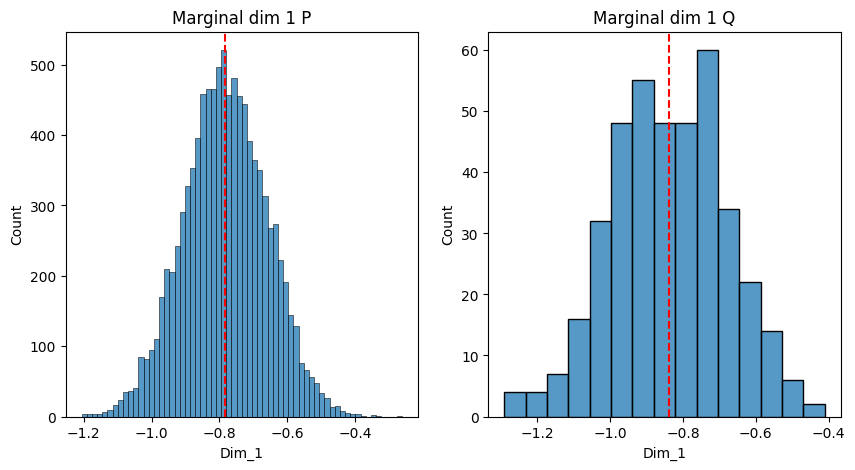

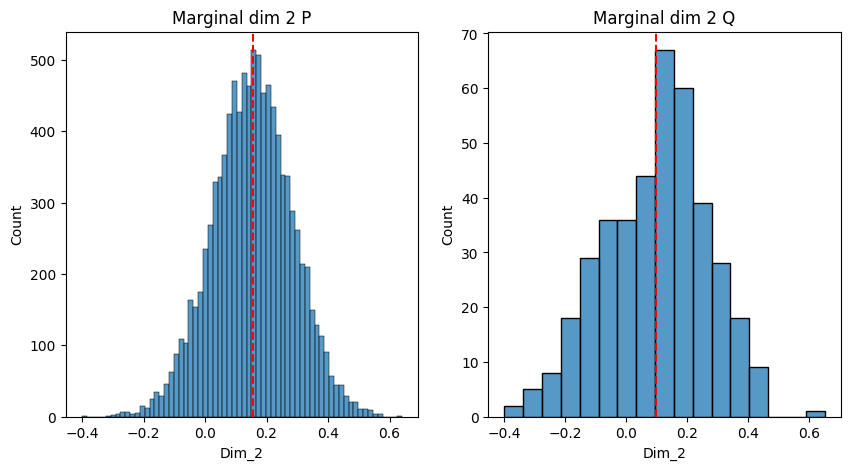

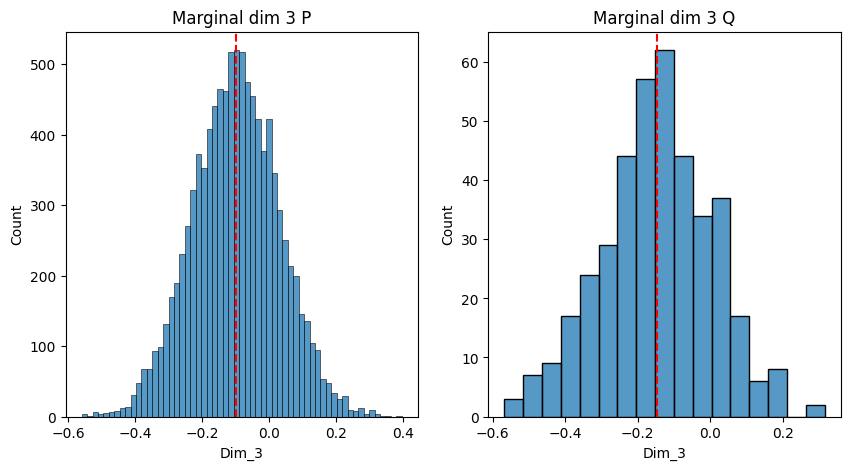

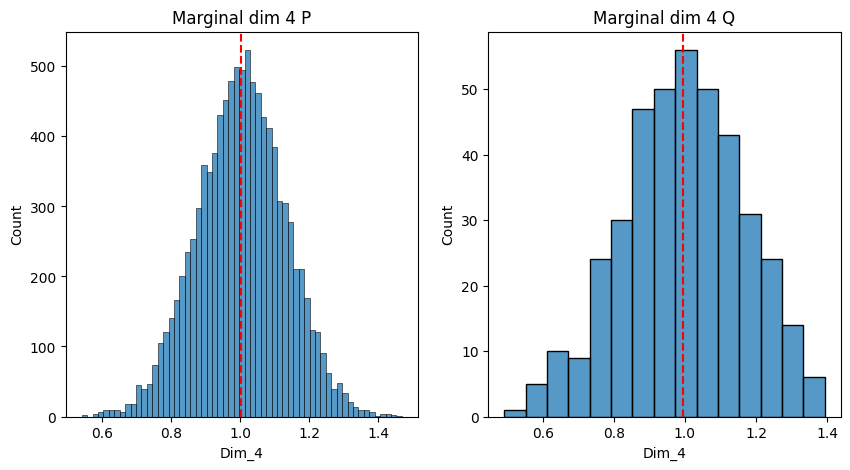

...

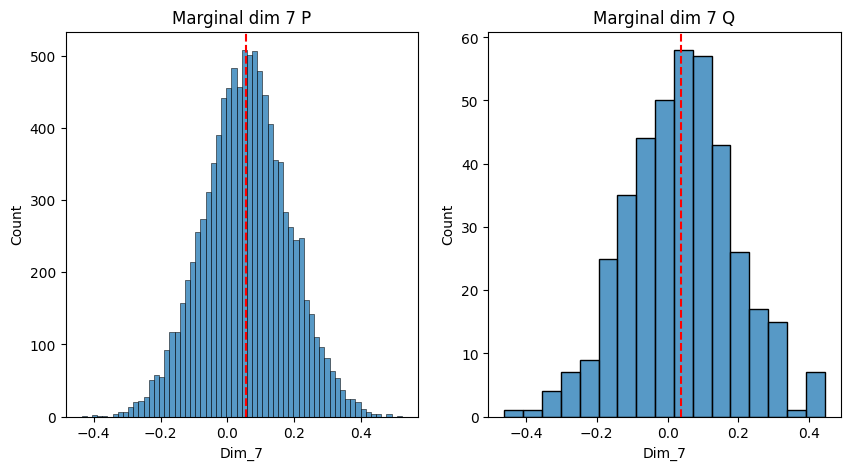

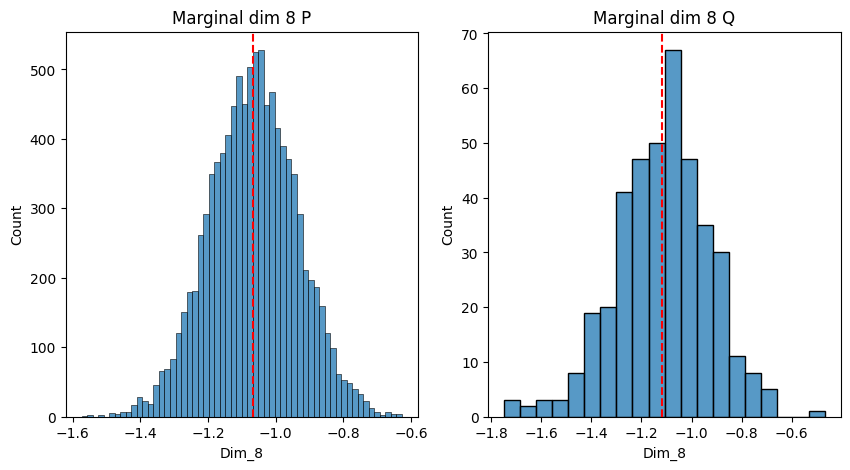

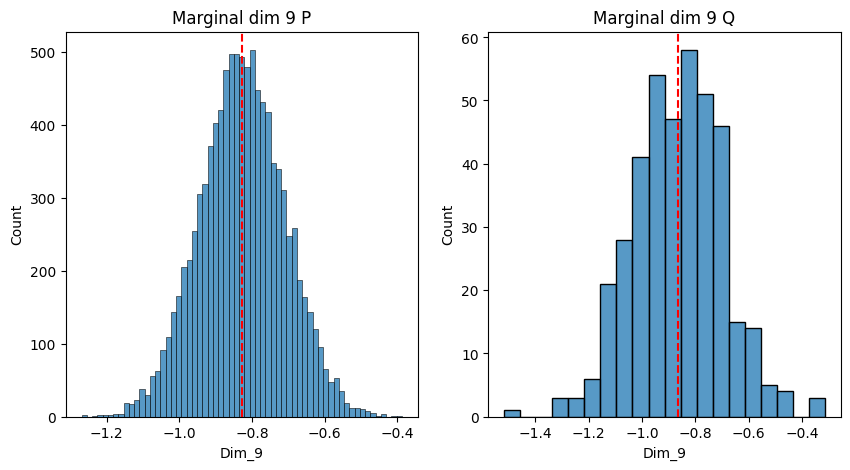

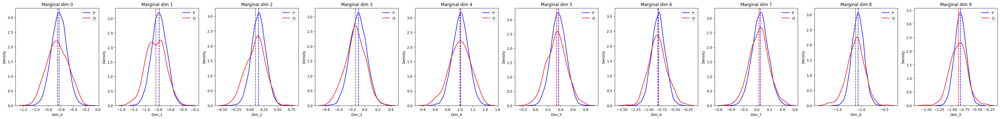

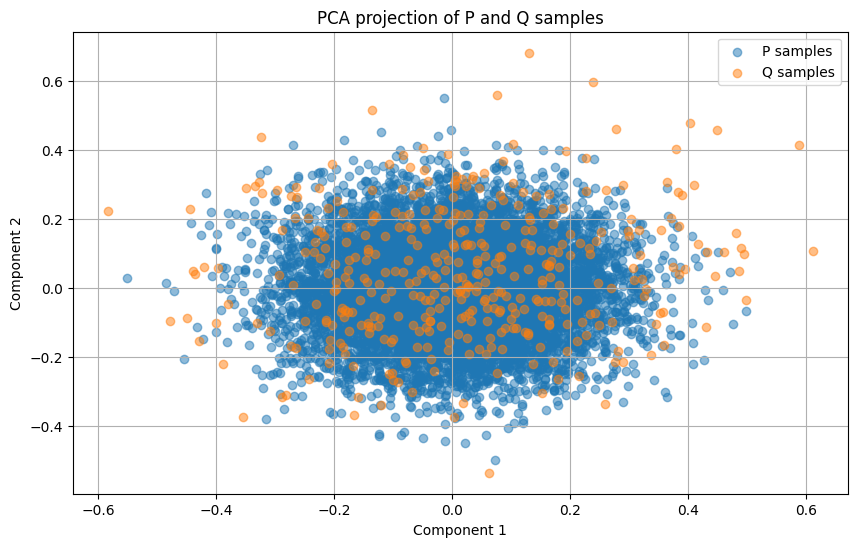

/usr/local/lib/python3.10/dist-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'beta_var'}
  warnings.warn(


....................


Sample: 100%|██████████| 800/800 [00:58, 13.71it/s, step size=1.69e-01, acc. prob=0.944]


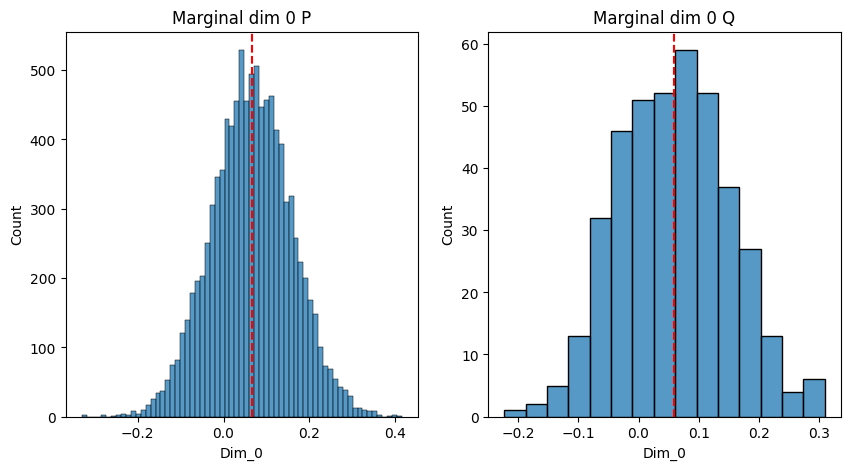

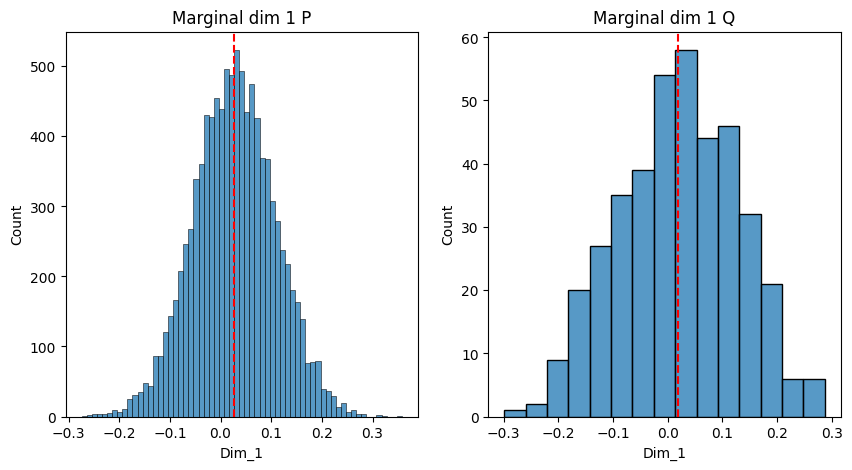

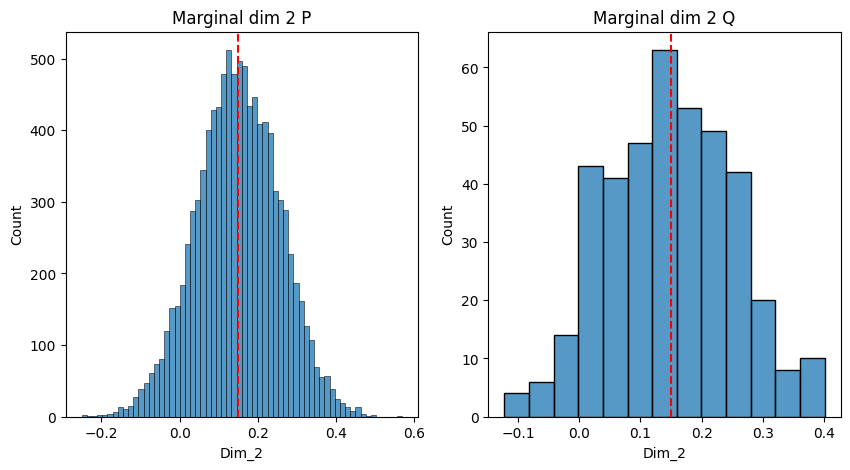

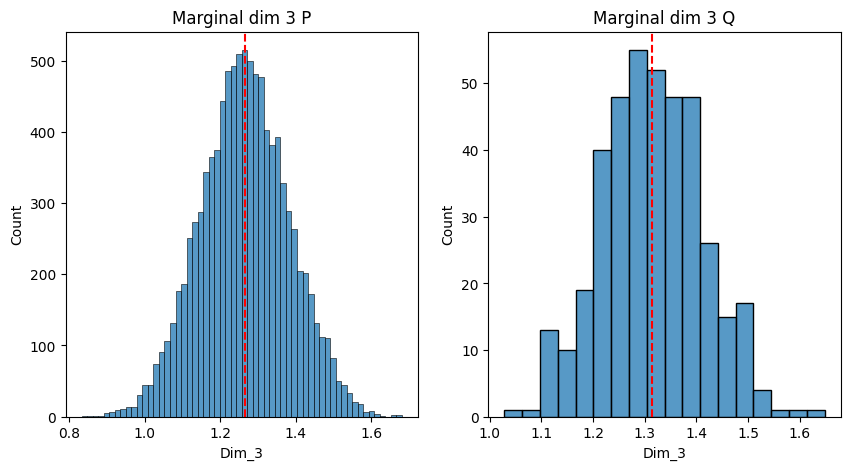

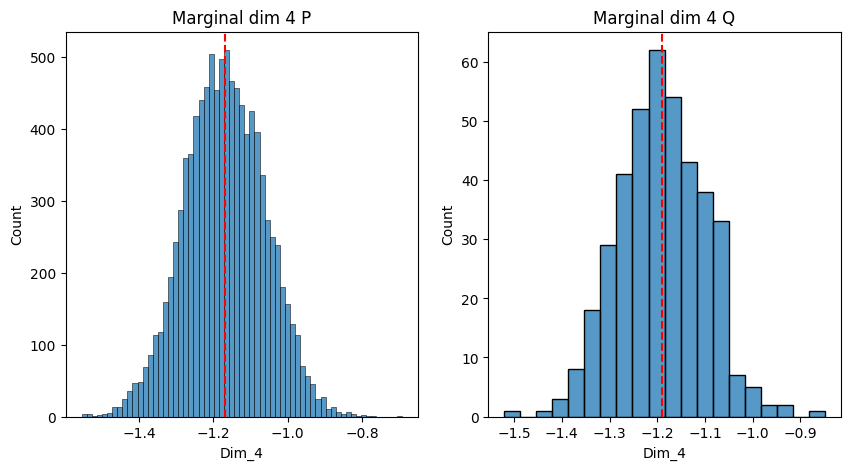

...

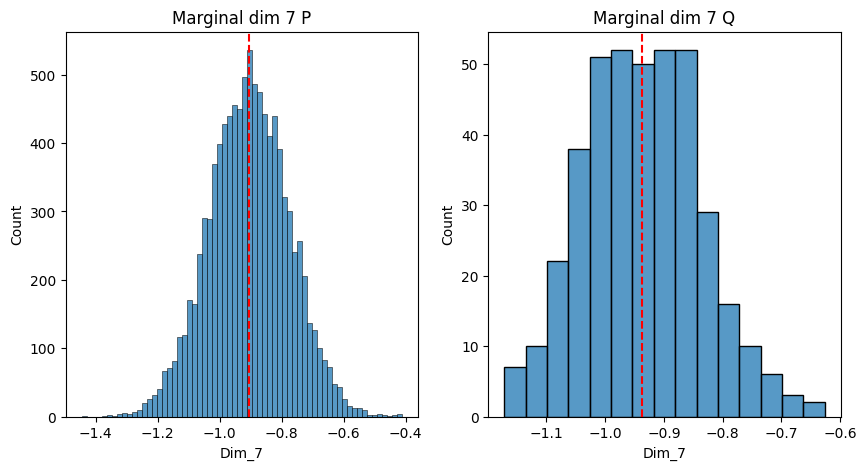

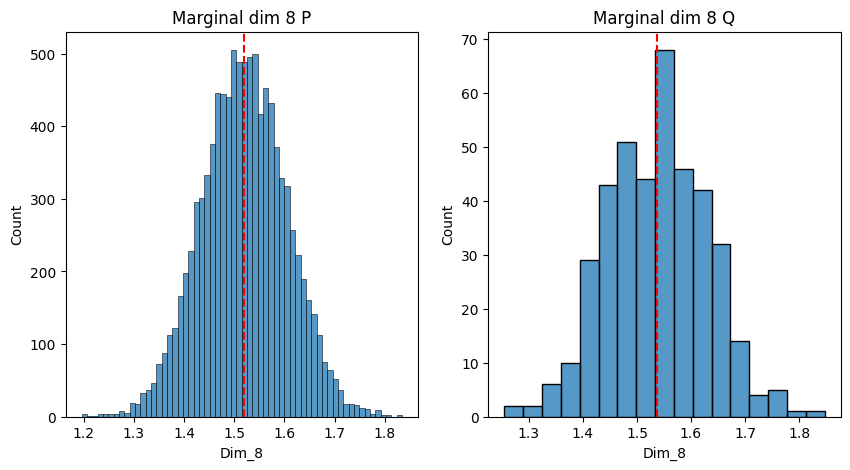

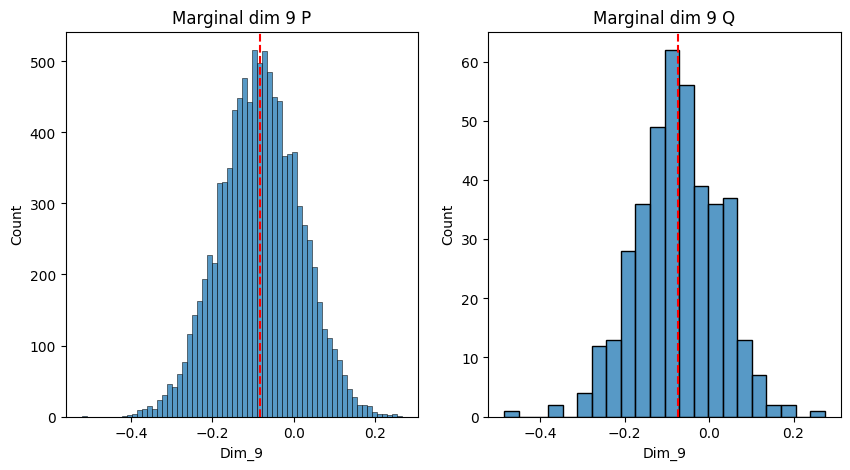

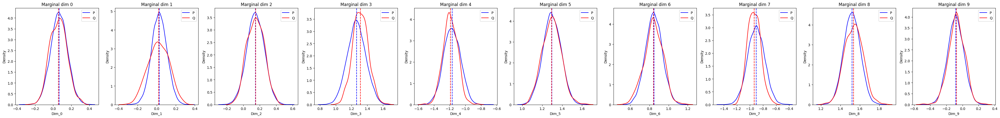

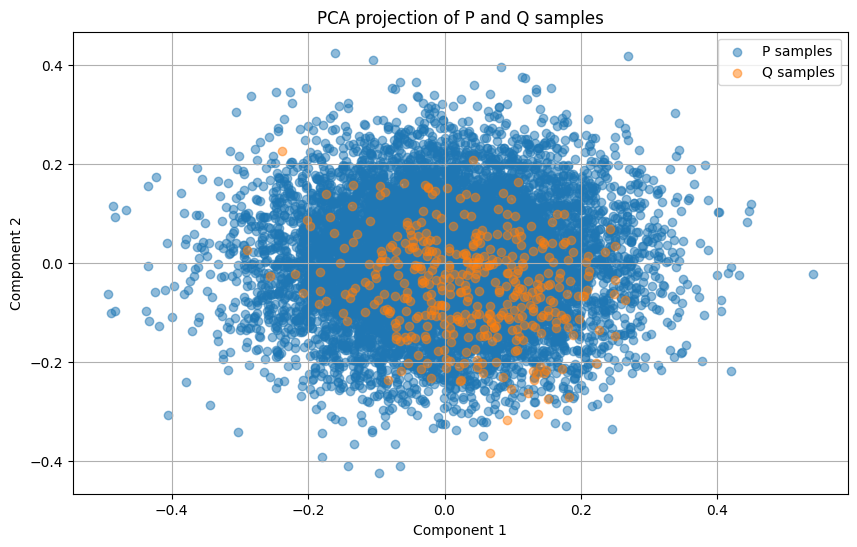

/usr/local/lib/python3.10/dist-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'beta_var'}
  warnings.warn(


....................


Sample: 100%|██████████| 800/800 [00:58, 13.70it/s, step size=1.85e-01, acc. prob=0.934]


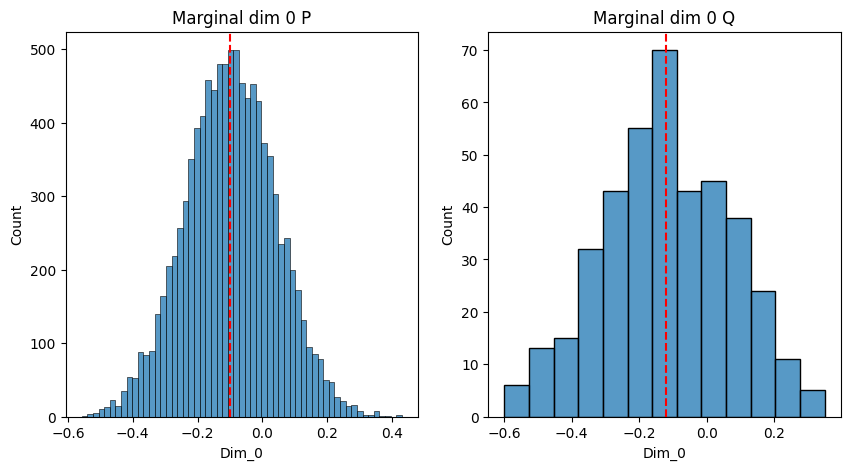

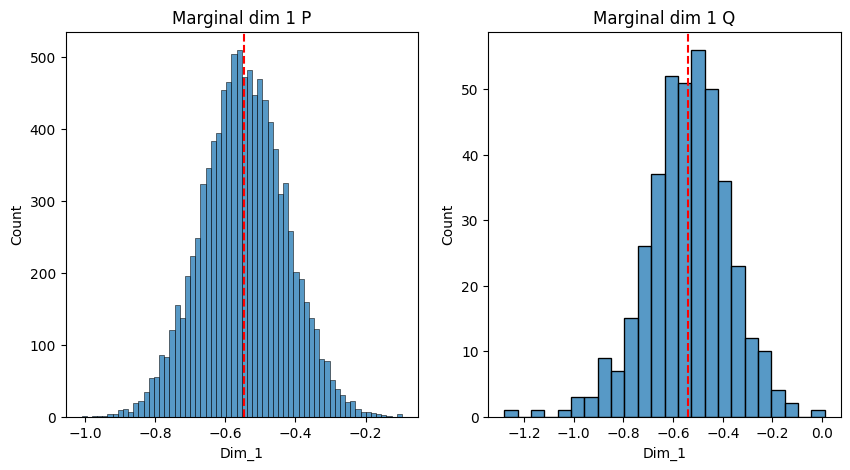

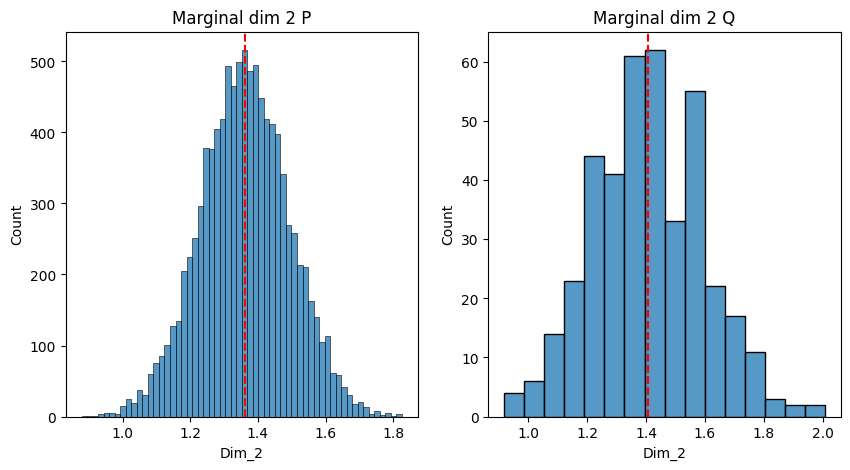

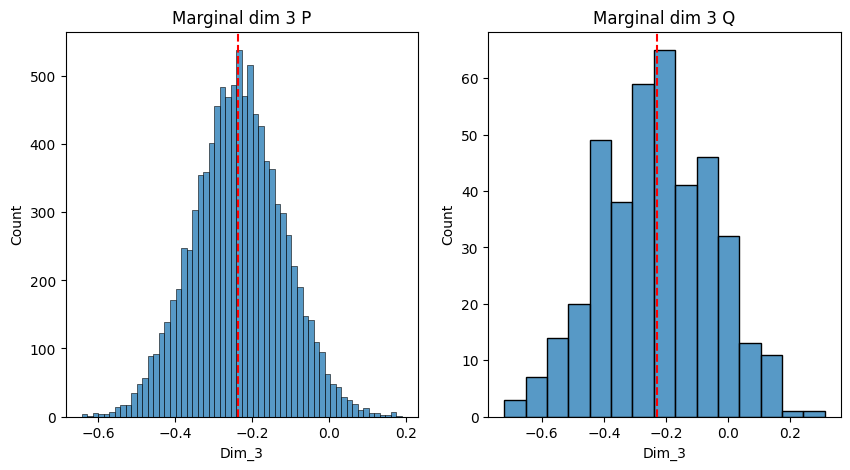

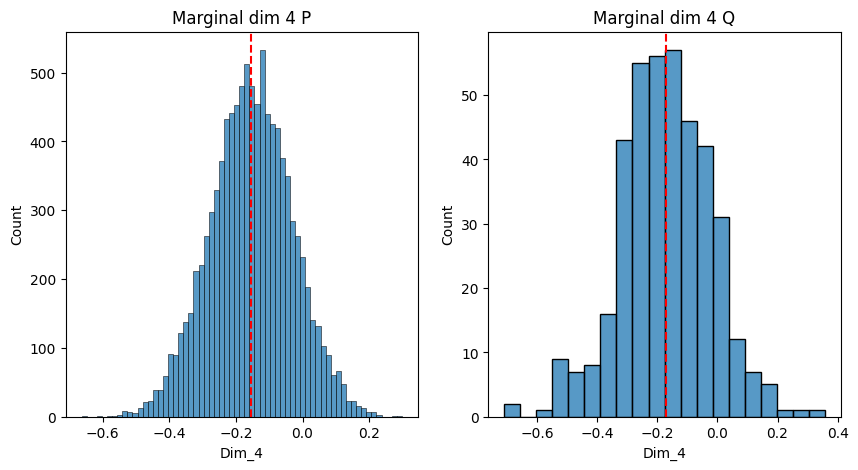

...

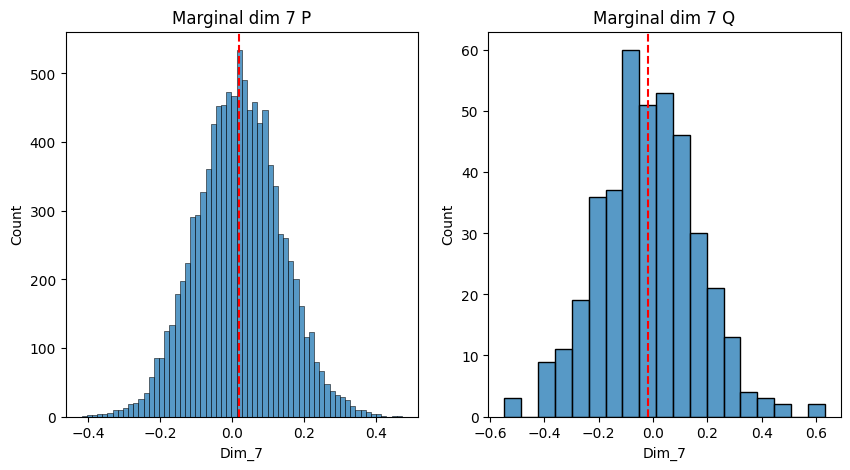

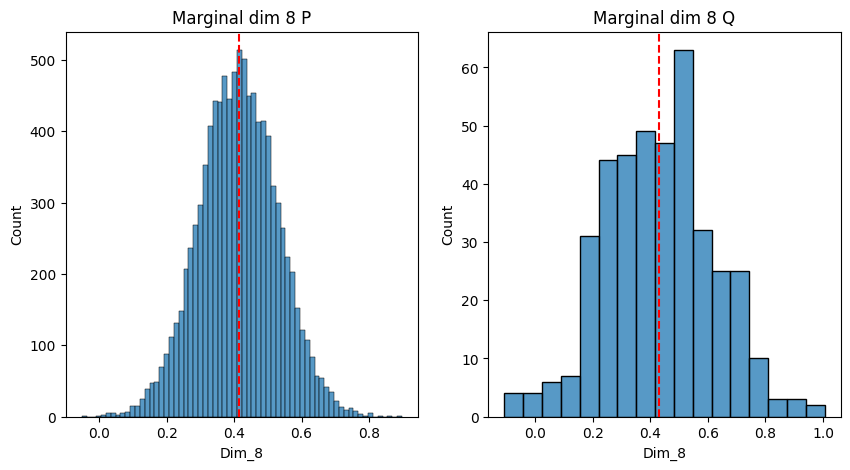

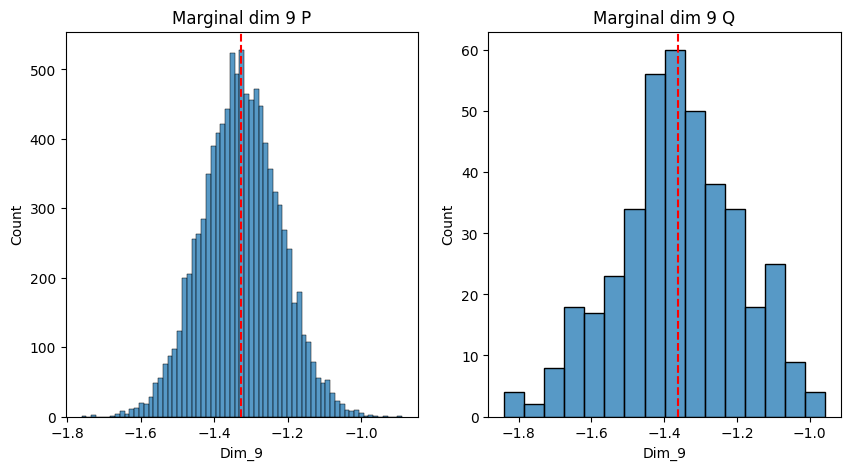

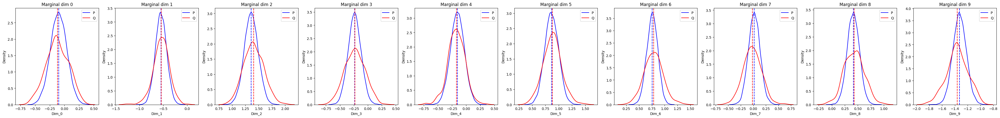

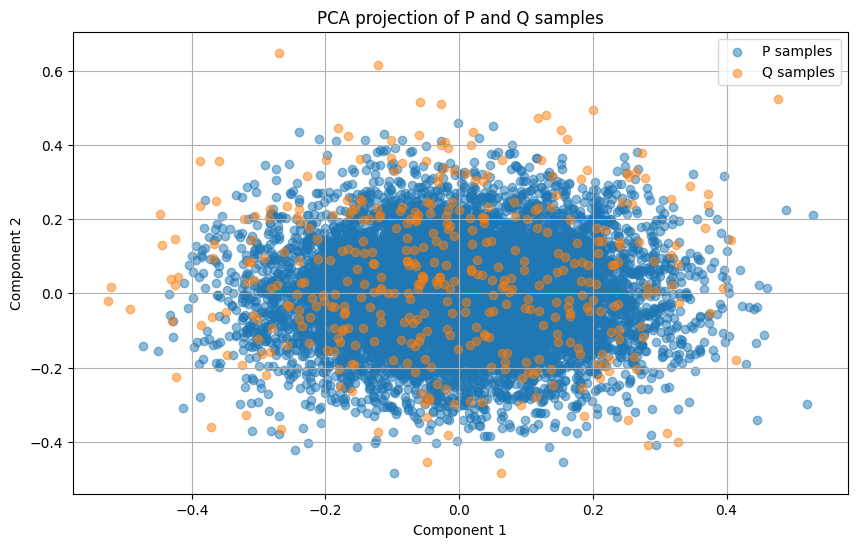

/usr/local/lib/python3.10/dist-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'beta_var'}
  warnings.warn(


....................


Sample: 100%|██████████| 800/800 [01:02, 12.74it/s, step size=1.65e-01, acc. prob=0.942]


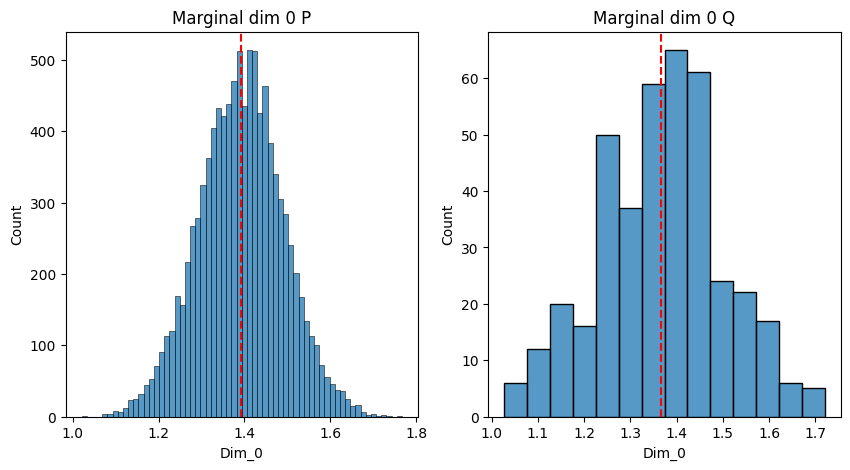

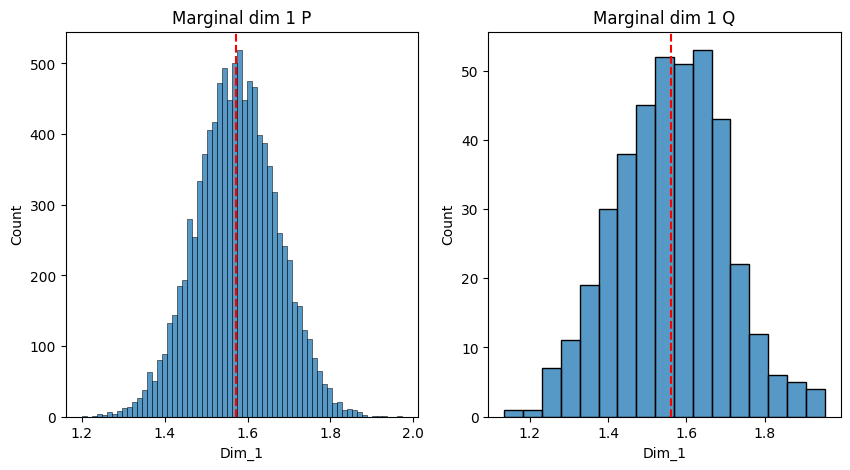

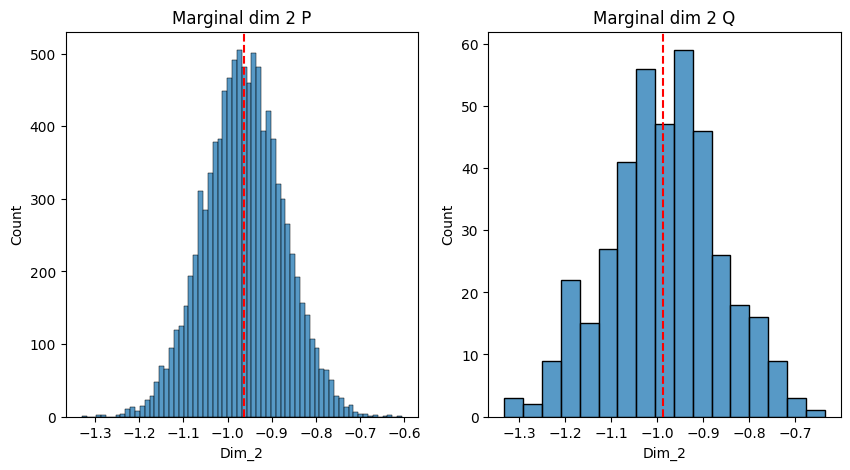

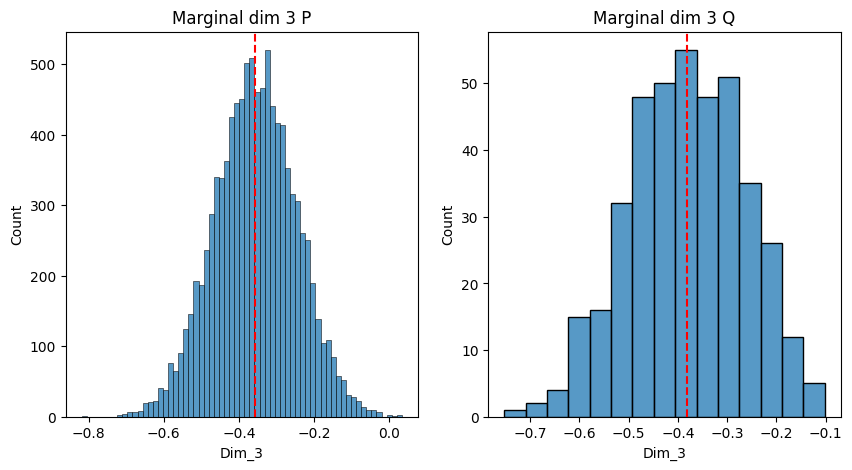

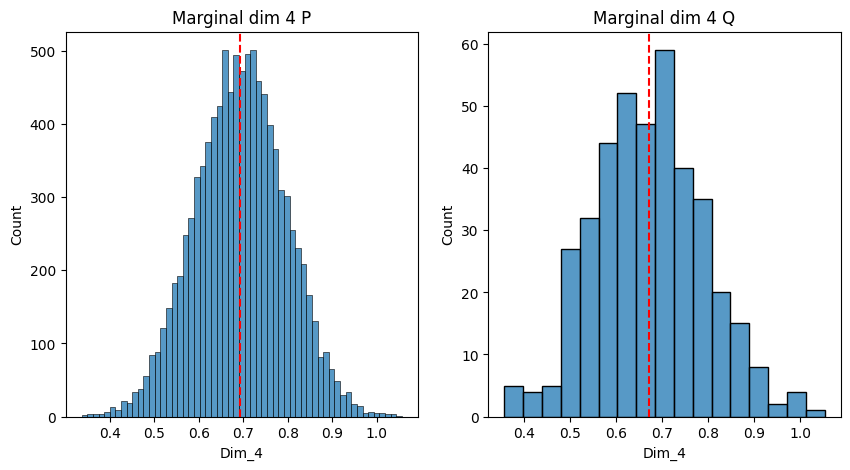

...

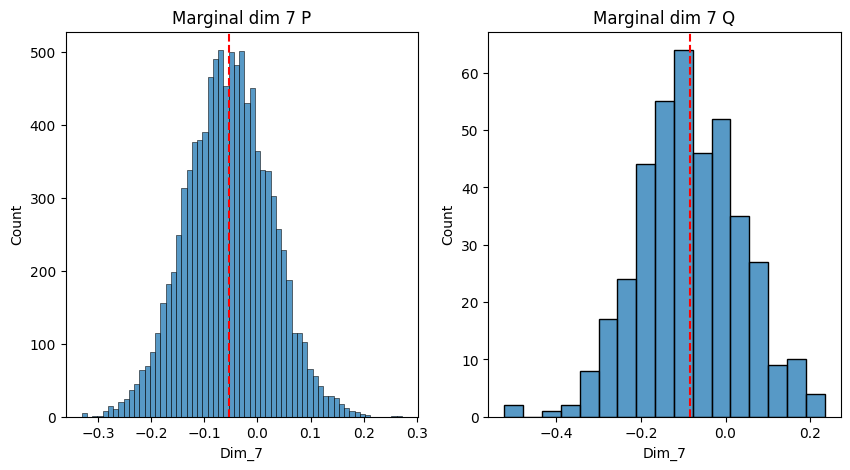

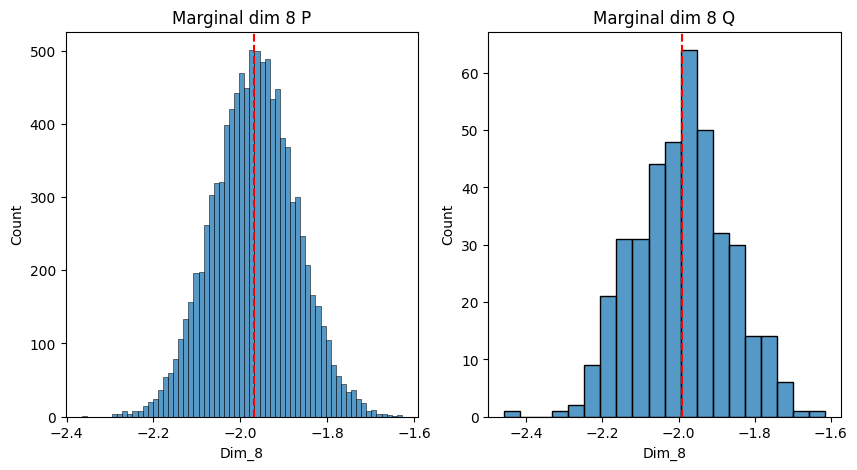

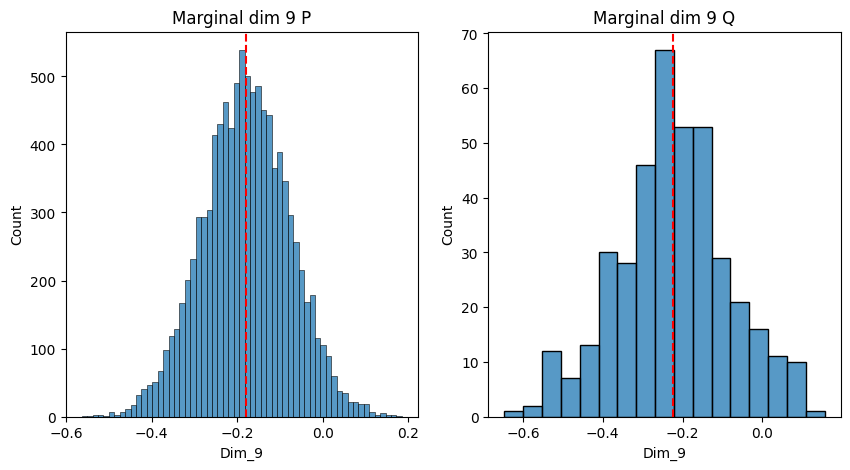

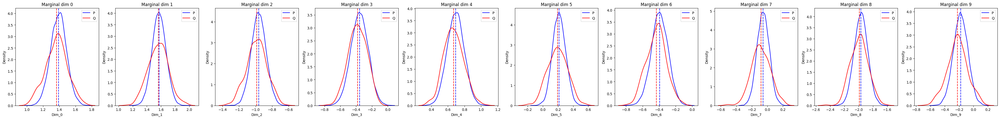

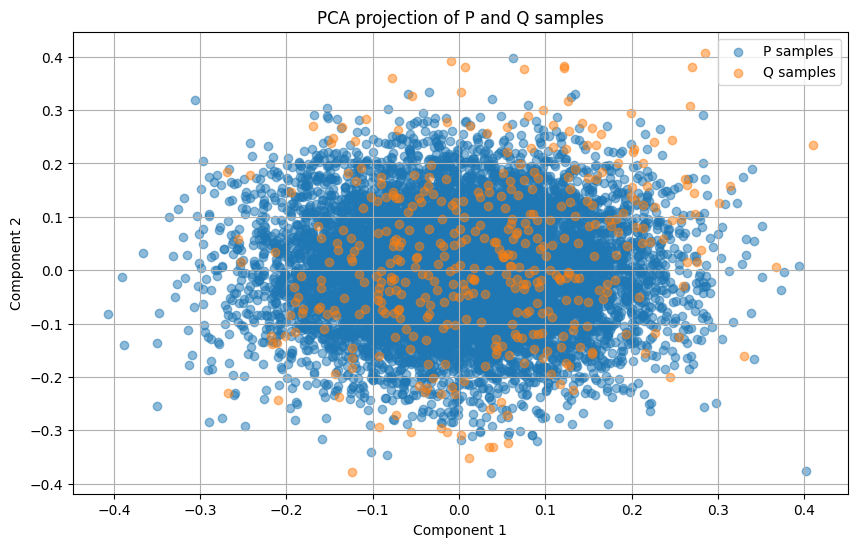

In [ ]:
vi_hmc_res = comparison_model_comparer.compare_sample_metrics_batch(test_batch["x"][:5], test_batch["y"][:5])

In [ ]:
print_wasserstein_distances(vi_hmc_res)

[0.4266628324985504, 0.3555838167667389, 0.22717873752117157, 0.3681538701057434, 0.2735488712787628]
0.33022562563419344
